In [1]:
# imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import glob
import subprocess
import math
import random
import time
from joblib import dump, load
import pickle

import rdkit
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem import rdmolops
from rdkit.Chem.Scaffolds.MurckoScaffold import MurckoScaffoldSmiles, GetScaffoldForMol
from rdkit import DataStructs
from rdkit.Chem import AllChem
from rdkit.ML.Cluster import Butina

# shut off warnings
from rdkit import RDLogger                                                                                                                                                               
RDLogger.DisableLog('rdApp.*')  

from sklearn.decomposition import PCA

from sklearn.manifold import TSNE

from sklearn.preprocessing import OneHotEncoder as SklearnOneHotEncoder

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split

from sklearn.metrics import precision_recall_curve, average_precision_score, plot_precision_recall_curve
from sklearn.metrics import auc
from sklearn.metrics import roc_auc_score, roc_curve, plot_roc_curve
from sklearn.metrics import cohen_kappa_score, matthews_corrcoef, confusion_matrix

In [2]:
# helper functions
class OneHotEncoder(SklearnOneHotEncoder):
    def __init__(self, **kwargs):
        super(OneHotEncoder, self).__init__(**kwargs)
        self.fit_flag = False

    def fit(self, X, **kwargs):
        out = super().fit(X)
        self.fit_flag = True
        return out

    def transform(self, X, **kwargs):
        sparse_matrix = super(OneHotEncoder, self).transform(X)
        new_columns = self.get_new_columns(X=X)
        d_out = pd.DataFrame(sparse_matrix.toarray(), columns=new_columns, index=X.index)
        return d_out

    def fit_transform(self, X, **kwargs):
        self.fit(X)
        return self.transform(X)

    def get_new_columns(self, X):
        new_columns = []
        for i, column in enumerate(X.columns):
            j = 0
            while j < len(self.categories_[i]):
                new_columns.append(f'{column}_<{self.categories_[i][j]}>')
                j += 1
        return new_columns

def multiple_labels(df, col_name):
    '''
    Splits compounds with multiple labels into separate entries with single labels
    '''
    df[col_name] = df[col_name].str.split(', ')
    df = df.explode(col_name, ignore_index=True)
    return df

def get_fps(df):
    '''
    gets RDKFingerprints from dataframe 
    '''
    mols = [Chem.MolFromSmiles(x) for x in df['canon_SMILES']]
    df['mols'] = mols
    fps = [Chem.RDKFingerprint(x) for x in mols if x is not None]
    return fps

def canon_smiles(smiles_string):
    '''
    converts smiles string to canon smiles string
    '''
    m = Chem.MolFromSmiles(smiles_string)
    return Chem.MolToSmiles(m)

def sort_by_frequency(nums):
    mp = {}
    for i in set(nums):
        x=nums.count(i)
        try:
            mp[x].append(i)
        except:
            mp[x]=[i]
    ans=[]

    for i in sorted(mp):
        for j in sorted(mp[i], reverse=True):
            ans.extend([j]*i)
    return ans

# Part 1: Read in data

In [3]:
# get morgan fingerprints for all
data_dir = '../data/'
# file_name = 'abx_MOA_fully_relabeled.csv'
file_name = 'abx_MOA_fully_relabeled_v3.csv'
file_path = data_dir+file_name

drugs = pd.read_csv(file_path)
print('initial length:',len(drugs))
not_nans = [type(smi) != float for smi in list(drugs['canon_SMILES'])]
drugs = drugs[not_nans] # filter for having SMILE
print('filtered for SMILES:',len(drugs))

labeled = [moa != 'unknown' for moa in list(drugs['labels'])]
labeled_drugs = drugs[labeled] # filter labeled drugs i.e. not unknown
print('labeled drugs:',len(labeled_drugs))
labeled_drugs = multiple_labels(labeled_drugs,'labels') # dealing with multiple MOA
labeled_drugs.replace('DNA','nucleic acid', inplace=True)
labeled_drugs.replace('protein','protein biosynthesis', inplace=True)
nonhuman_mask = [label != 'human' for label in labeled_drugs.labels]
nonhuman_drugs = labeled_drugs[nonhuman_mask]

# changing labeled drugs to nonhuman drugs #
labeled_drugs = nonhuman_drugs.copy()      #
print('nonhuman drugs:',len(labeled_drugs))#
############################################

# making OHE labels excluding unknown
one = OneHotEncoder()
df = labeled_drugs['labels'].to_frame()
OHE_df = one.fit_transform(df)
OHE_labels = OHE_df.to_numpy()

# labeled abx
labeled_mols = [Chem.MolFromSmiles(x) for x in labeled_drugs['canon_SMILES']]
labeled_drugs = labeled_drugs.assign(mols=labeled_mols)
labeled_fps = [Chem.RDKFingerprint(x) for x in labeled_mols if x is not None]

# nonhuman drugs
nonhuman_mols = [Chem.MolFromSmiles(x) for x in nonhuman_drugs['canon_SMILES']]
nonhuman_drugs['mols'] = nonhuman_mols
nonhuman_fps = [Chem.RDKFingerprint(x) for x in nonhuman_mols if x is not None]

# include abx labeled as unknown MOA
col_name = 'labels'
all_drugs = drugs.copy()
all_drugs['labels'].fillna('unknown',inplace=True)
all_drugs = multiple_labels(all_drugs,col_name) # dealing with multiple MOA
all_drugs.replace('DNA','nucleic acid', inplace=True)
all_drugs.replace('protein','protein biosynthesis', inplace=True)
all_mols = [Chem.MolFromSmiles(x) for x in all_drugs['canon_SMILES']]
all_fps = [Chem.RDKFingerprint(x) for x in all_mols if x is not None]

# labeled_drugs

initial length: 2856
filtered for SMILES: 2856
labeled drugs: 2835
nonhuman drugs: 2772


<ipython-input-2-18b7ff8f9832>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col_name] = df[col_name].str.split(', ')


# Part 2: PCA & TSNE for dataset + abx

In [4]:
# calculate PCA
pca = PCA(n_components=2)
crds = pca.fit_transform(nonhuman_fps)
print('variance explained by pc1+pc2: ' + str(np.sum(pca.explained_variance_ratio_)))

variance explained by pc1+pc2: 0.21362353125462338


In [5]:
crds_df = pd.DataFrame(crds,columns=["PC_1","PC_2"])
crds_df['label'] = nonhuman_drugs['labels'].to_list()

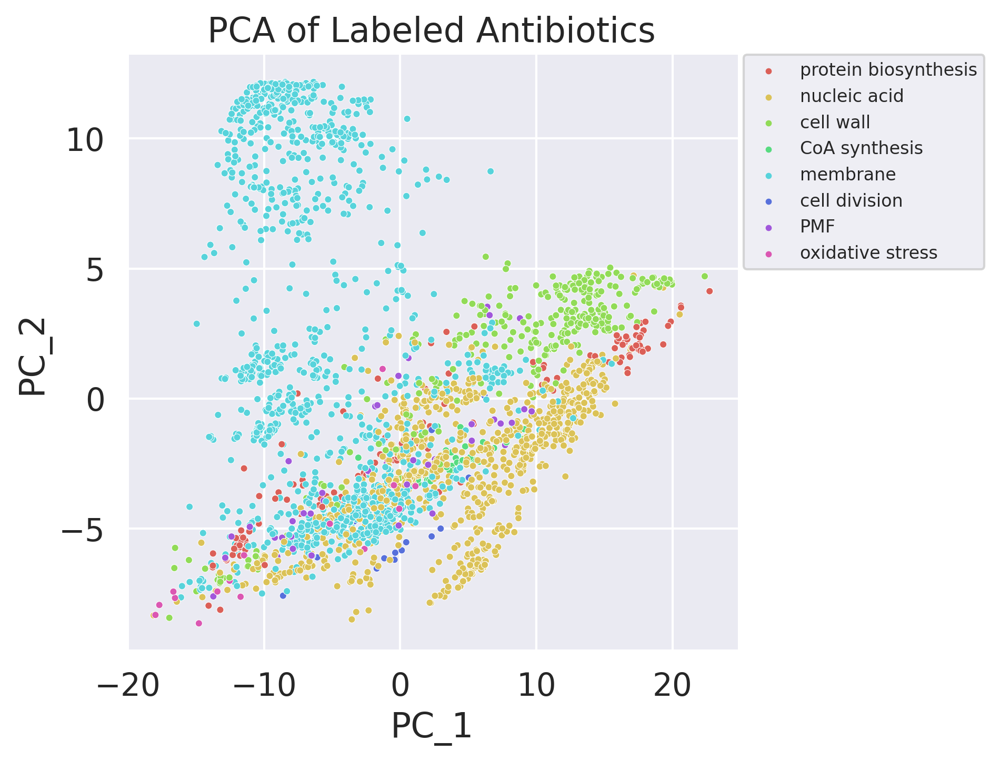

In [6]:
# plot PCA
sns.set(font_scale=1.3)  # increase font size
fig = plt.figure(figsize=(5,5), dpi = 300)

ax = sns.scatterplot(data=crds_df,x="PC_1",y="PC_2",hue="label", palette=sns.color_palette("hls", len(set(crds_df['label']))), s=10)
ax.set(title='PCA of Labeled Antibiotics')
plt.legend(bbox_to_anchor=(1.01, 1),
           borderaxespad=0, fontsize=8, markerscale=0.3)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

fig.savefig('../outputs/moa_relabeled_PCA.png',bbox_inches='tight')

In [7]:
# calculate tsne
pca = PCA(n_components=50)
crds = pca.fit_transform(nonhuman_fps)

%time crds_embedded = TSNE(n_components=2).fit_transform(crds)

labeled_tsne_df = pd.DataFrame(crds_embedded,columns=["X","Y"])
labeled_tsne_df['label'] = nonhuman_drugs['labels'].to_list()

CPU times: user 2min 53s, sys: 1.8 s, total: 2min 54s
Wall time: 21.8 s


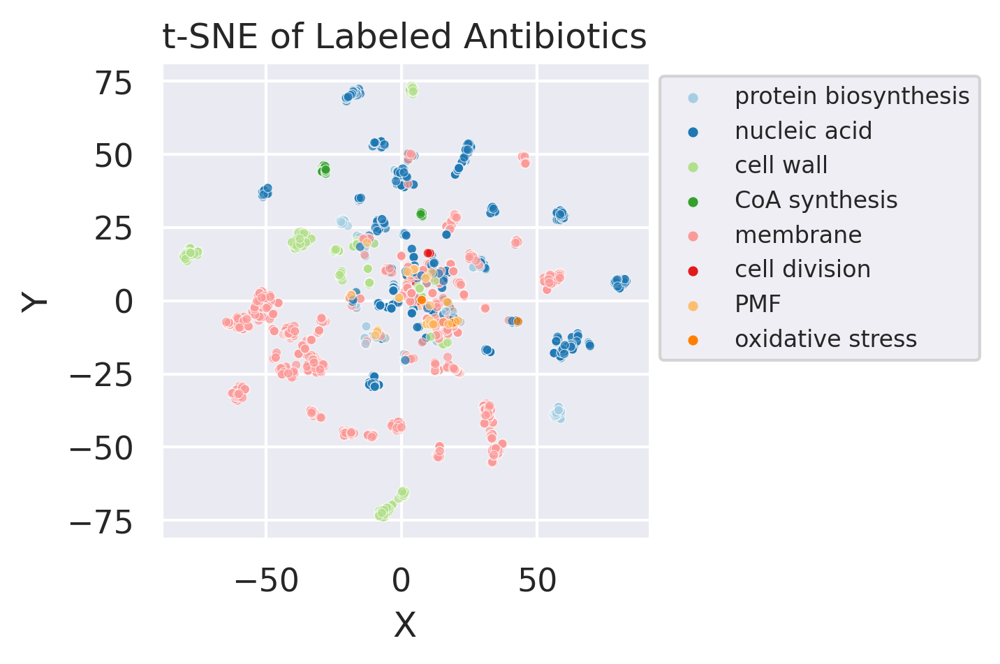

In [8]:
# plot tsne
sns.set(font_scale=1)  # increase font size
fig = plt.figure(figsize=(3,3), dpi = 300)
ax = sns.scatterplot(data=labeled_tsne_df,x="X",y="Y",hue="label", alpha = 0.7,palette=sns.color_palette("Paired", len(set(nonhuman_drugs['labels']))), s = 10)
ax.set(title='t-SNE of Labeled Antibiotics')    
plt.legend(loc='best', bbox_to_anchor=(1.0, 0.5, 0.5, 0.5), fontsize=8, markerscale=0.4,)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)
fig.savefig('../outputs/relabeled_abx_tSNE.png',bbox_inches='tight')

In [9]:
# You can click on the legend to flexibly select classes to show
fig = px.scatter(labeled_tsne_df, x='X', y='Y', color='label',title='t-SNE of Labeled Antibiotics', )
fig.show()

In [10]:
# computing 3D t-SNE
pca = PCA(n_components=50)
crds = pca.fit_transform(labeled_fps)

%time crds_embedded = TSNE(n_components=3).fit_transform(crds)

threeD_tsne_df = pd.DataFrame(crds_embedded,columns=["X","Y","Z"])
threeD_tsne_df['label'] = labeled_drugs['labels'].to_list()
threeD_tsne_df['compound'] = labeled_drugs['Compound'].to_list()

CPU times: user 3min 55s, sys: 1.56 s, total: 3min 56s
Wall time: 24.8 s


In [11]:
# You can click on the legend to flexibly select classes to show
fig = px.scatter_3d(threeD_tsne_df, x='X', y='Y', z='Z', color='label',title='t-SNE of Labeled Antibiotics', opacity=0.6, )
fig.show()

# Part 3: t-SNE subplots

In [12]:
# recompute t-SNE
pca = PCA(n_components=50)
crds = pca.fit_transform(labeled_fps)

%time crds_embedded = TSNE(n_components=2).fit_transform(crds)

tsne_df = pd.DataFrame(crds_embedded,columns=["X","Y"])
tsne_df['label'] = labeled_drugs['labels'].to_list()

CPU times: user 3min 54s, sys: 2.52 s, total: 3min 56s
Wall time: 42.6 s


{'protein biosynthesis', 'oxidative stress', 'nucleic acid', 'CoA synthesis'}


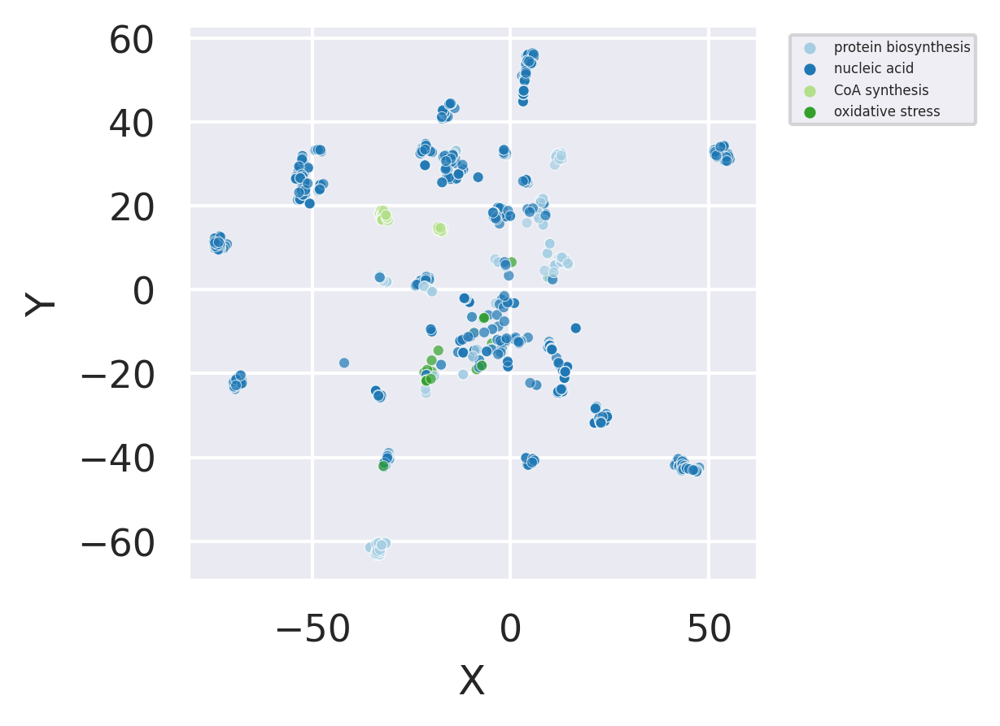

In [13]:
# plot first subset
sns.set(font_scale=1)  # increase font size

filt = [moa == 'nucleic acid' or moa == 'protein biosynthesis' or moa == 'oxidative stress' or moa == 'CoA synthesis' for moa in list(tsne_df['label'])]
tsne_df1 = tsne_df[filt]
print(set(tsne_df1['label']))

fig = plt.figure(figsize=(3,3), dpi = 300)
ax = sns.scatterplot(data=tsne_df1,x="X",y="Y",hue="label", alpha = 0.7,palette=sns.color_palette("Paired", len(set(tsne_df1['label']))), s = 10)
plt.legend(loc='best', bbox_to_anchor=(0.9, 0.5, 0.5, 0.5), fontsize=4, markerscale=0.4)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)
fig.savefig('../outputs/relabeled_abx_tSNE_subset_1.png',bbox_inches='tight')

{'cell division', 'membrane', 'cell wall', 'CoA synthesis'}


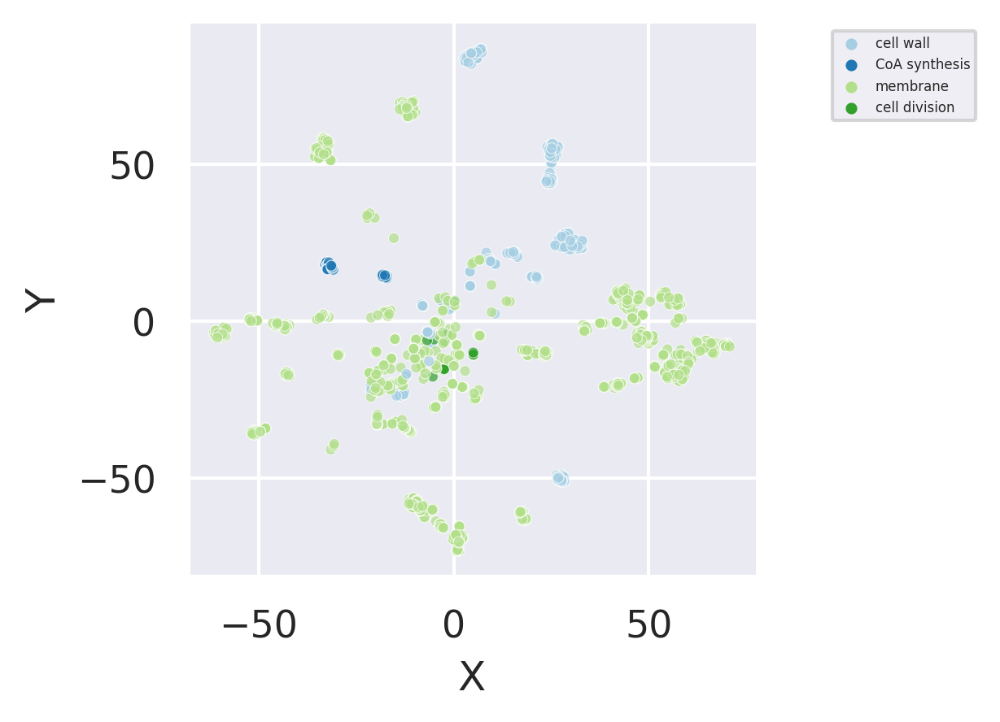

In [14]:
# plot second subset
sns.set(font_scale=1)  # increase font size

filt = [moa == 'cell wall' or moa == 'cell division' or moa == 'membrane' or moa == 'CoA synthesis' for moa in list(tsne_df['label'])]
tsne_df2 = tsne_df[filt]
print(set(tsne_df2['label']))

fig = plt.figure(figsize=(3,3), dpi = 300)
ax = sns.scatterplot(data=tsne_df2,x="X",y="Y",hue="label", alpha = 0.7,palette=sns.color_palette("Paired", len(set(tsne_df2['label']))), s = 10)
plt.legend(loc='best', bbox_to_anchor=(0.9, 0.5, 0.5, 0.5), fontsize=4, markerscale=0.4)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)
fig.savefig('../outputs/relabeled_abx_tSNE_subset_2.png',bbox_inches='tight')

{'PMF', 'protein biosynthesis', 'nucleic acid', 'membrane'}


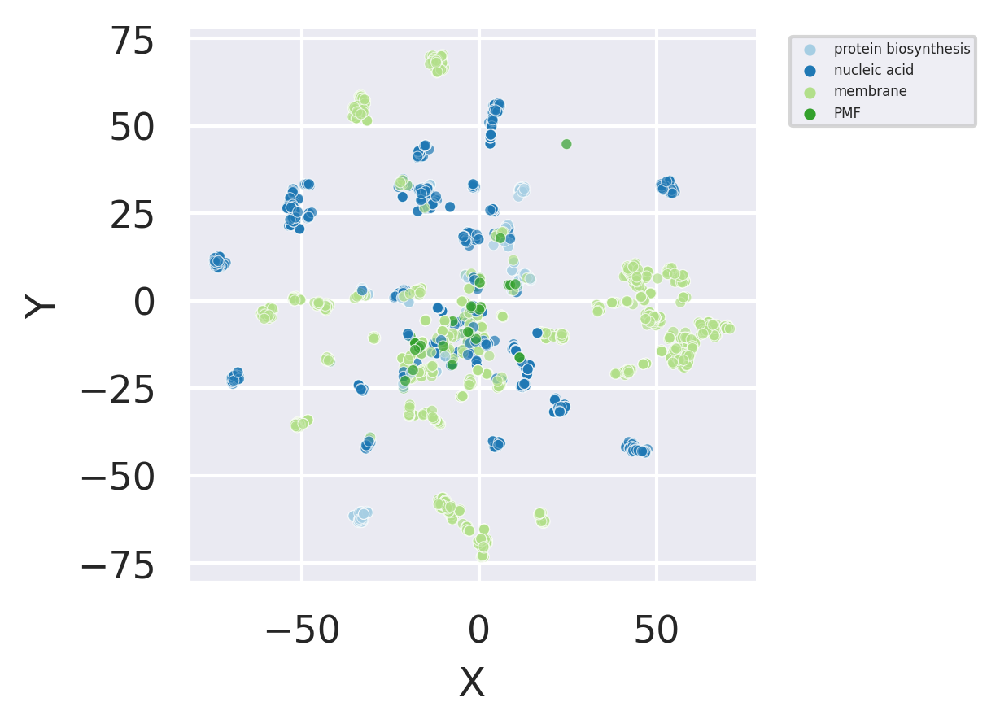

In [15]:
# plot third subset
sns.set(font_scale=1)  # increase font size

filt = [moa == 'nucleic acid' or moa == 'membrane' or moa == 'PMF' or moa == 'protein biosynthesis' for moa in list(tsne_df['label'])]
tsne_df3 = tsne_df[filt]
print(set(tsne_df3['label']))

fig = plt.figure(figsize=(3,3), dpi = 300)
ax = sns.scatterplot(data=tsne_df3,x="X",y="Y",hue="label", alpha = 0.7,palette=sns.color_palette("Paired", len(set(tsne_df3['label']))), s = 10)
plt.legend(loc='best', bbox_to_anchor=(0.9, 0.5, 0.5, 0.5), fontsize=4, markerscale=0.4)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)
fig.savefig('../outputs/relabeled_abx_tSNE_subset_3.png',bbox_inches='tight')

# Part 4: Analyzing Class Balance

In [16]:
# plot barplot with frequencies of all labels
label_set = list(set(all_drugs['labels']))
print('label_set:',label_set)
frequencies = []
for label in label_set:
    frequencies.append(all_drugs['labels'].to_list().count(label))
class_balance_df = pd.DataFrame()
class_balance_df['labels'] = label_set
class_balance_df['frequency'] = frequencies

label_set: ['unknown', 'membrane', 'CoA synthesis', 'human', 'nucleic acid', 'cell division', 'oxidative stress', 'PMF', 'protein biosynthesis', 'cell wall']


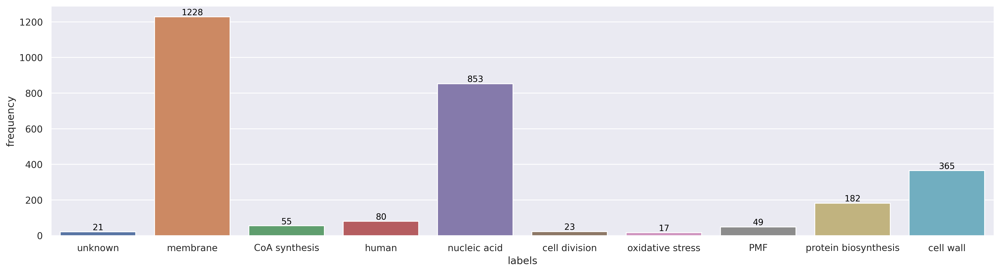

In [17]:
fig = plt.figure(figsize=(20,5), dpi = 300)
ax = sns.barplot(x="labels", y="frequency", data=class_balance_df, )
for p in ax.patches:
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
    textcoords='offset points')
fig.savefig('../outputs/relabeled_class_balance.png')

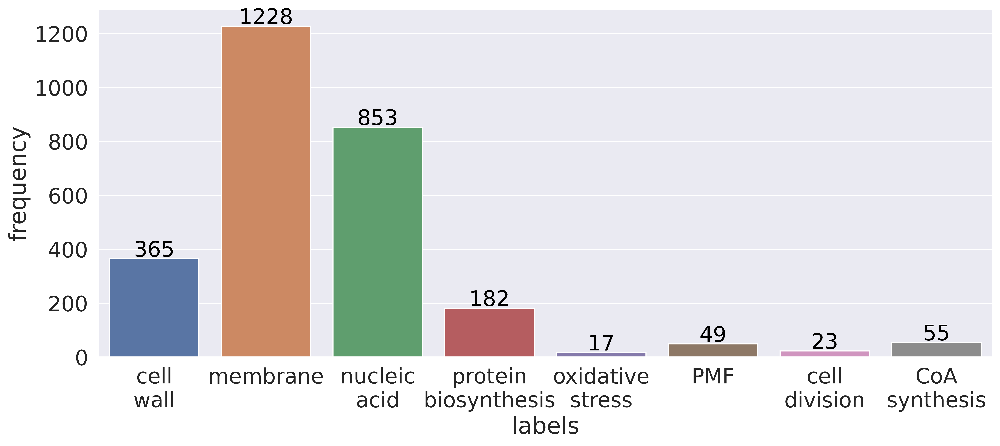

In [18]:
# Plot frequencies of labels used in models
label_set = ['cell wall','membrane','nucleic acid','protein biosynthesis','oxidative stress','PMF','cell division', 'CoA synthesis']
frequencies = []
for label in label_set:
    frequencies.append(all_drugs['labels'].to_list().count(label))
class_balance_df = pd.DataFrame()
class_balance_df['labels'] = ['cell\nwall','membrane','nucleic\nacid','protein\nbiosynthesis','oxidative\nstress','PMF','cell\ndivision', 'CoA\nsynthesis']
class_balance_df['frequency'] = frequencies
fig = plt.figure(figsize=(15,6), dpi = 600)
sns.set(font_scale=1.8)
ax = sns.barplot(x="labels", y="frequency", data=class_balance_df, )
# ax.set_yticklabels([0,200,400,600,800,1000,1200,1400])
for p in ax.patches:
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()+10),
    ha='center', va='center', fontsize=20, color='black', xytext=(0, 5),
    textcoords='offset points')
fig.savefig('../outputs/PRISE_class_balance.png')

# Part 5: Analyzing intraclass similarity

In [19]:
# calculates the maximum Tanimoto similarity and mean of the top 10 percentile within each class
label_set = list(set(labeled_drugs['labels']))
time1 = time.perf_counter()

tanimotos = {}
for label in label_set:
    within_class = []
    labeled = [moa == label for moa in list(drugs['labels'])]
    label_df = drugs[labeled]
    label_mols = [Chem.MolFromSmiles(x) for x in label_df['canon_SMILES']]
    label_fps = [Chem.RDKFingerprint(x) for x in label_mols if x is not None]
    for fp1 in label_fps:
        for fp2 in label_fps:
            if fp1 != fp2:
                tanimoto = DataStructs.TanimotoSimilarity(fp1,fp2)
                within_class.append(tanimoto)
    tanimotos[label] = sorted(within_class)
    tanimotos[label+'_percentile'] = np.mean(tanimotos[label][-len(tanimotos[label])//10:])
    print('The maximum Tanimoto similarity for class "{}" is {}.'.format(label,np.max(tanimotos[label])))
    print('The mean of the top 10 percentile for class "{}" is {}.'.format(label,np.mean(tanimotos[label][-len(tanimotos[label])//10:])))
time2 = time.perf_counter()
print("time: {}".format(time2-time1))

The maximum Tanimoto similarity for class "membrane" is 0.9983193277310924.
The mean of the top 10 percentile for class "membrane" is 0.6134318861691985.
The maximum Tanimoto similarity for class "CoA synthesis" is 0.981094527363184.
The mean of the top 10 percentile for class "CoA synthesis" is 0.909992325587122.
The maximum Tanimoto similarity for class "nucleic acid" is 0.9989258861439313.
The mean of the top 10 percentile for class "nucleic acid" is 0.6543133347505664.
The maximum Tanimoto similarity for class "cell division" is 0.989451476793249.
The mean of the top 10 percentile for class "cell division" is 0.8864523412341864.
The maximum Tanimoto similarity for class "oxidative stress" is 0.8549540347293156.
The mean of the top 10 percentile for class "oxidative stress" is 0.3439049325563365.
The maximum Tanimoto similarity for class "PMF" is 0.9987562189054726.
The mean of the top 10 percentile for class "PMF" is 0.5425602310069229.
The maximum Tanimoto similarity for class "pr

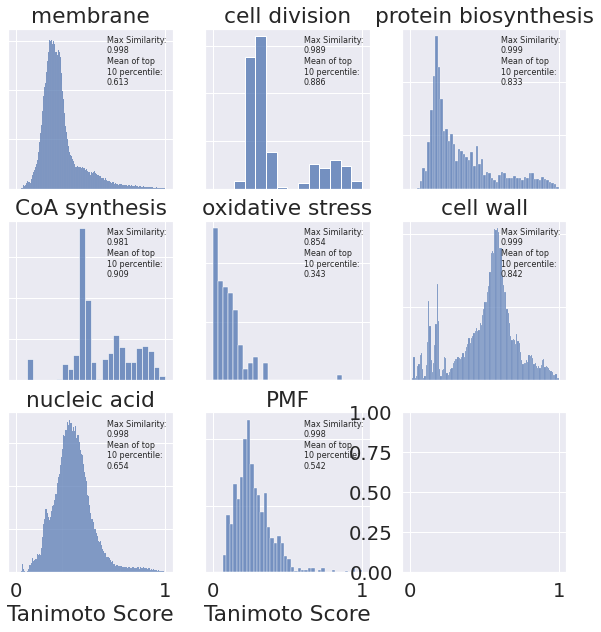

In [20]:
# plotting Tanimoto distributions
axis_coords = [(0,0),(1,0),(2,0),(0,1),(1,1),(2,1),(0,2),(1,2),(2,2)]
fig, axes = plt.subplots(3, 3, figsize=(10,10), sharey=False, sharex=True)
for coords, label in zip(axis_coords, label_set):
    axes[coords] = sns.histplot(ax = axes[coords], x=tanimotos[label],binrange=(0,1))
    axes[coords].set_title(label)
    axes[coords].set_xlabel('Tanimoto Score')
    axes[coords].set_ylabel('')
    axes[coords].axes.yaxis.set_ticklabels([])
    maximum = 'Max Similarity: \n'+str(np.max(tanimotos[label]))[0:5]
    ten_percentile = 'Mean of top\n10 percentile: \n'+str(tanimotos[label+'_percentile'])[0:5]
    plt.text(0.6, 0.85, maximum, transform=axes[coords].transAxes, fontsize=8)
    plt.text(0.6, 0.65, ten_percentile, transform=axes[coords].transAxes, fontsize=8)
fig.savefig('../outputs/tanimoto_distributions.png')

# Part 6: Representative Set of Antibiotic Classes

membrane ****************************************************************************************************


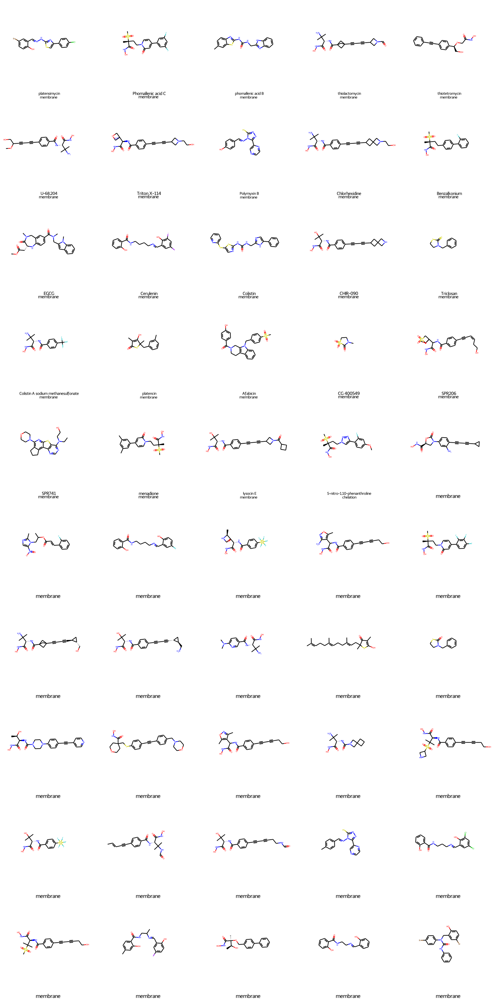

CoA synthesis ****************************************************************************************************


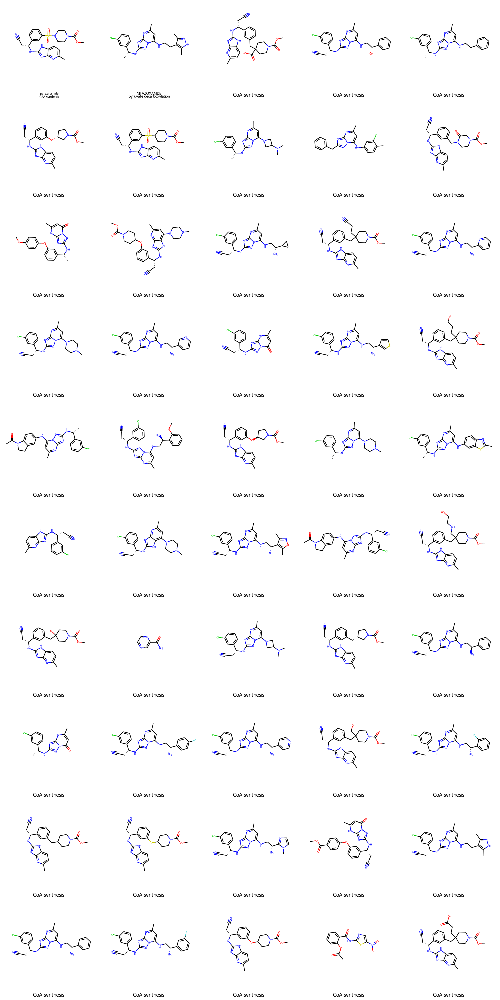

nucleic acid ****************************************************************************************************


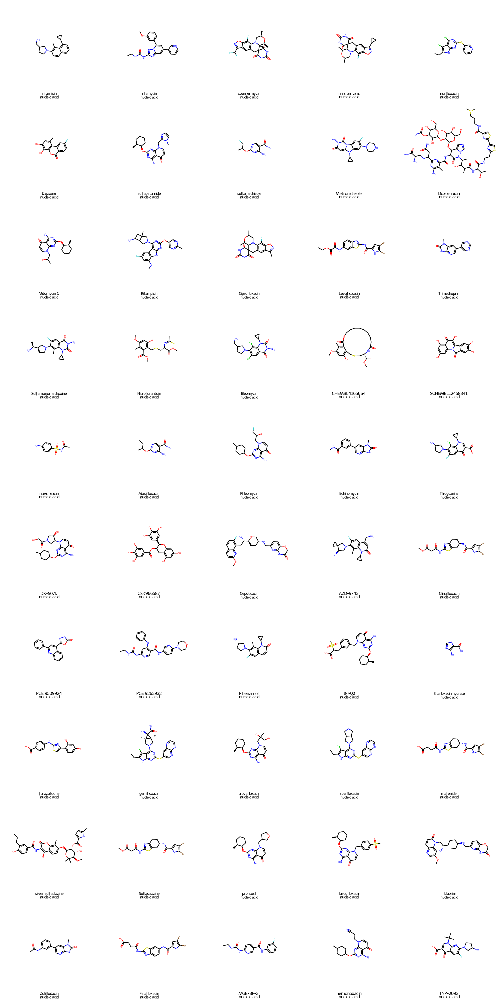

cell division ****************************************************************************************************


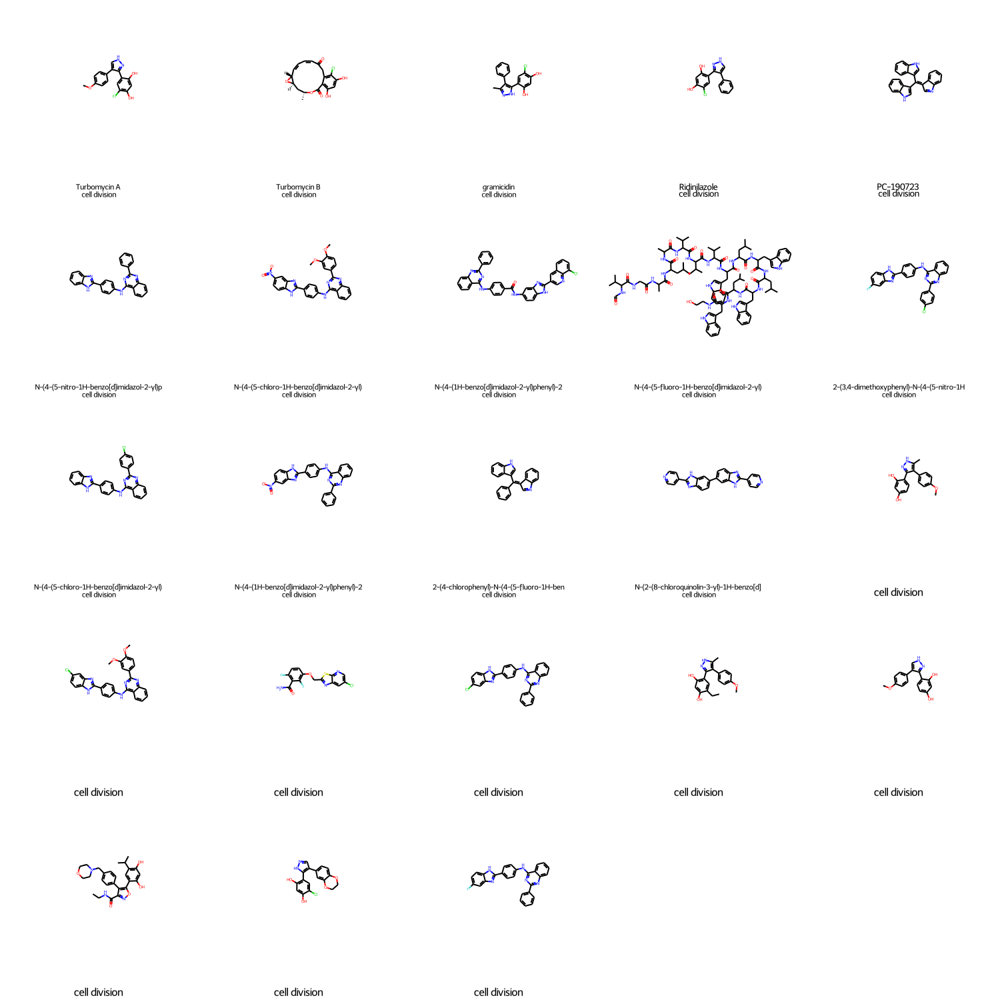

oxidative stress ****************************************************************************************************


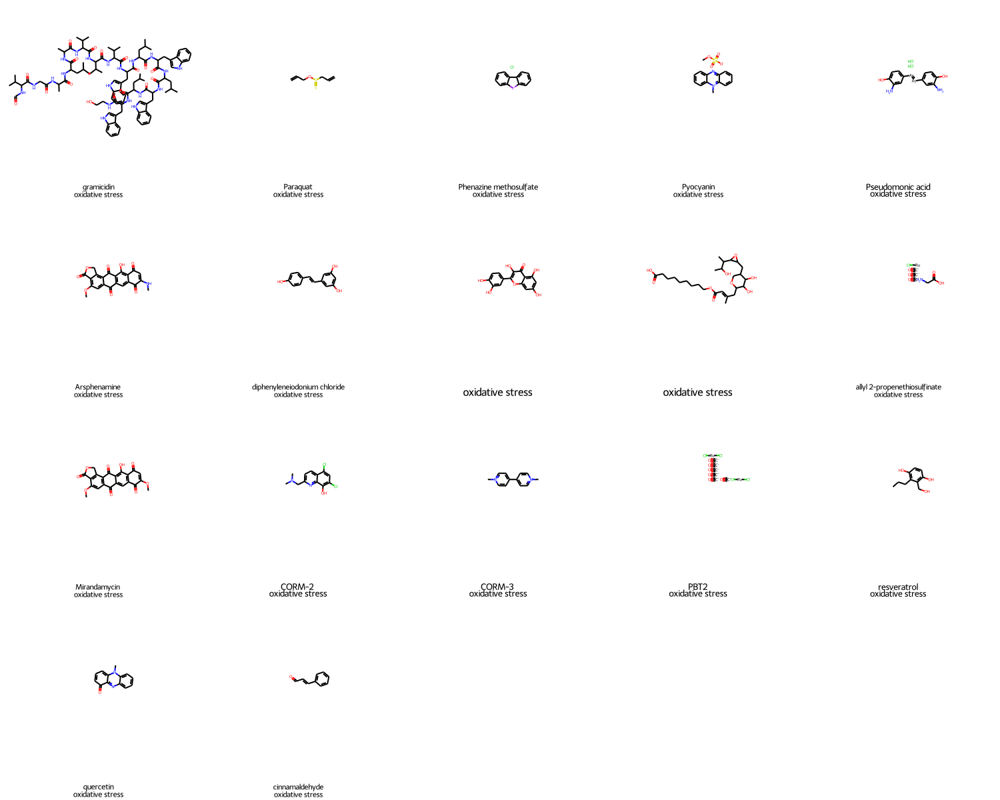

PMF ****************************************************************************************************


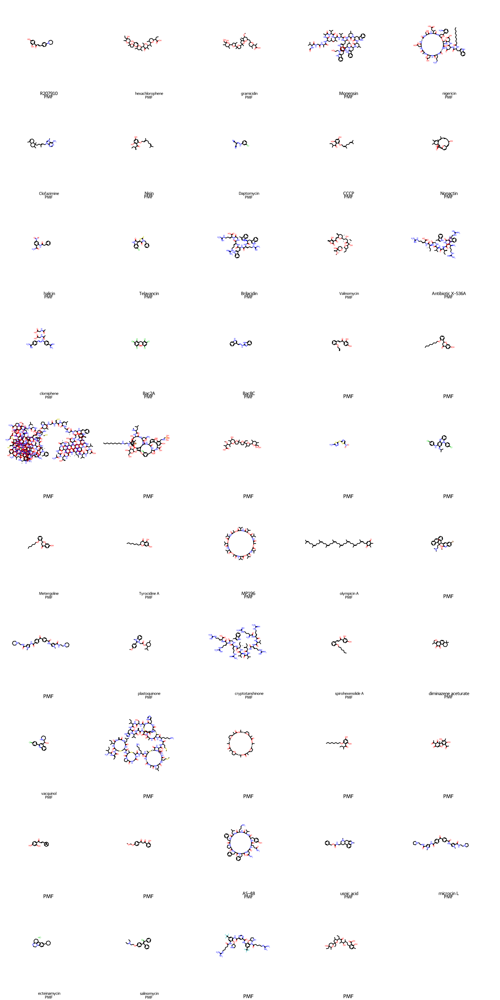

protein biosynthesis ****************************************************************************************************


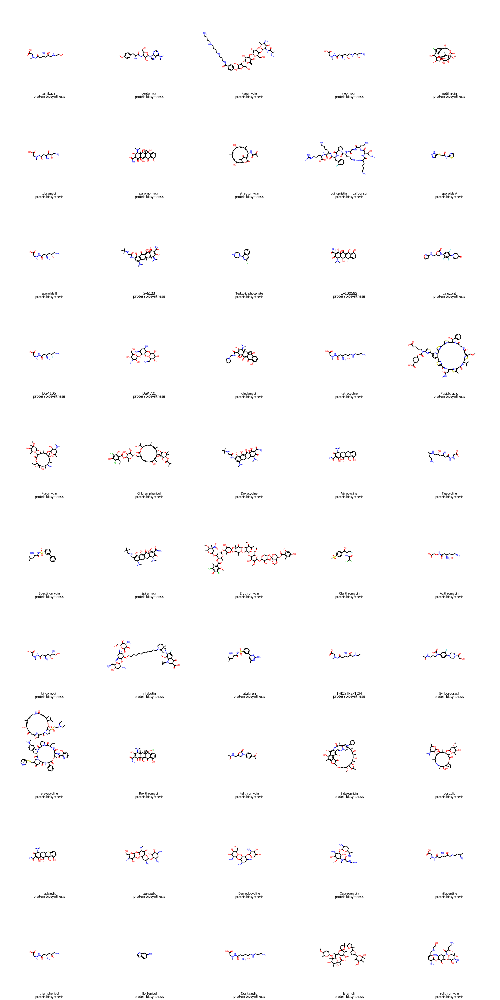

cell wall ****************************************************************************************************


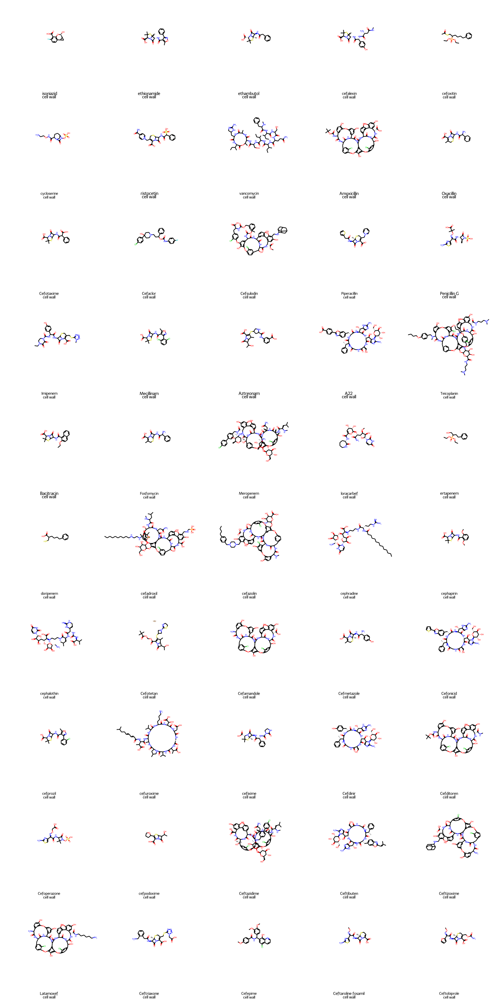

In [21]:
# displays a representative set of antibiotics from each class
n_mols = 50
for MOA in label_set:
    filt = [label == MOA for label in labeled_drugs['labels']]
    MOA_filtered_drugs = labeled_drugs[filt]
    name_list = MOA_filtered_drugs['Compound'].to_list()
    legend_list = [MOA if pd.isna(name) else name[:40]+'\n'+MOA for name in name_list]
    legend_list = ['NITAZOXANIDE\npyruvate decarboxylation' if 'NITAZOXANIDE' in name else name for name in legend_list]
    legend_list = ['nitroxoline\nchelation' if 'nitroxoline' in name else name for name in legend_list]
    legend_list = ['5-nitro-1,10-phenanthroline\nchelation' if '5-nitro-1,10-phenanthroline' in name else name for name in legend_list]
    legend_list = ['pyrazinamide\nCoA synthesis' if 'pyrazinamide' in name else name for name in legend_list]
    legend_list = ['CoA synthesis' if 'other' in name else name for name in legend_list]
    mols = MOA_filtered_drugs['mols'].to_list()
    mols = random.sample(mols,min(n_mols,len(mols)))
    abx_img = Draw.MolsToGridImage(mols, molsPerRow=5, subImgSize=(300,300), returnPNG=False, maxMols=n_mols, legends=legend_list)
#     abx_img.save('../outputs/'+MOA+'_abx.png')
    print(MOA,'*'*100)
    abx_img.show()
#     input("Press Enter to continue...")

# Part 7: Murcko Scaffolds by MOA

In [22]:
# plotting the most common Murcko scaffolds within each MOA class

scaffold_dict = {}
for label in label_set:
    mask = [MOA == label for MOA in labeled_drugs['labels']]
    moa_df = labeled_drugs[mask]
    scaffold_smiles = [MurckoScaffoldSmiles(SMILES) for SMILES in moa_df['canon_SMILES']]
    scaffold_mols = [Chem.MolFromSmiles(x) for x in scaffold_smiles]
    scaffold_dict[label]=(scaffold_smiles,scaffold_mols)

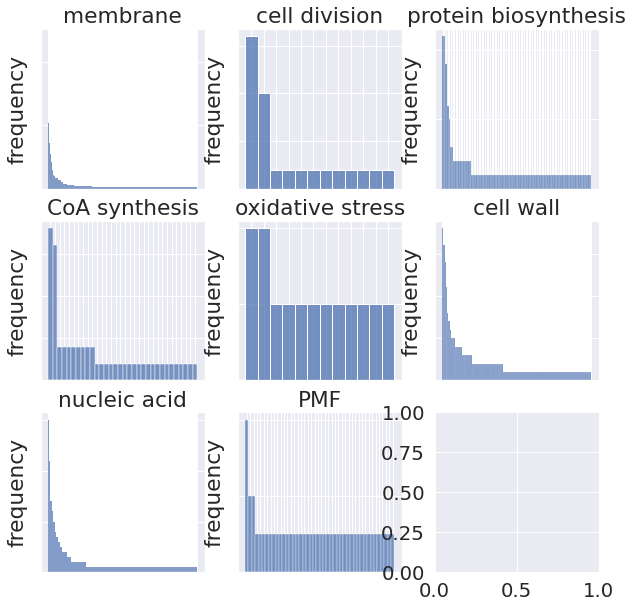

In [23]:
# histograms to visualize the frequency distribution of Murcko scaffolds
# find most frequent scaffolds
# show scaffold + frequency / total in class

axis_coords = [(0,0),(1,0),(2,0),(0,1),(1,1),(2,1),(0,2),(1,2),(2,2)]
fig, axes = plt.subplots(3, 3, figsize=(10,10), sharey=False, sharex=False)
for coords, label in zip(axis_coords, label_set):
    smiles = scaffold_dict[label][0]
    sorted_smiles = sort_by_frequency(smiles)
    sorted_smiles.reverse()
    
    while '' in sorted_smiles: sorted_smiles.remove('') # removing '' scaffolds under the assumption that they are not identical
        
    axes[coords] = sns.histplot(ax = axes[coords], x=sorted_smiles) #binrange=(0,1))
    axes[coords].set_title(label)
#     axes[coords].set_xlabel('')
    axes[coords].set_ylabel('frequency')
#     for p in ax.patches:
#         axes[coords].annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
#         ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
#         textcoords='offset points')

    axes[coords].axes.yaxis.set_ticklabels([])
    axes[coords].axes.xaxis.set_ticklabels([])
    
    
fig.savefig('../outputs/murcko_scaffold_histograms.png')

membrane
c1ccccc1: 120/1224
O=C(NCC1CNC1)c1ccccc1: 52/1224
c1ccc(-c2ccccc2)cc1: 42/1224
C(C#CC1CNC1)#Cc1ccccc1: 36/1224
O=C(NCCN=Cc1ccccc1)c1ccccc1: 32/1224
O=C1C=CSC1: 31/1224
O=c1cc(-c2ccccc2)cc[nH]1: 27/1224
O=C(c1ccccc1)N1CCc2c(n(Cc3ccccc3)c3ccccc23)C1: 25/1224
C(#Cc1ccccc1)c1ccccc1: 22/1224
O=C(NCC1CS(=O)(=O)C1)c1ccccc1: 21/1224


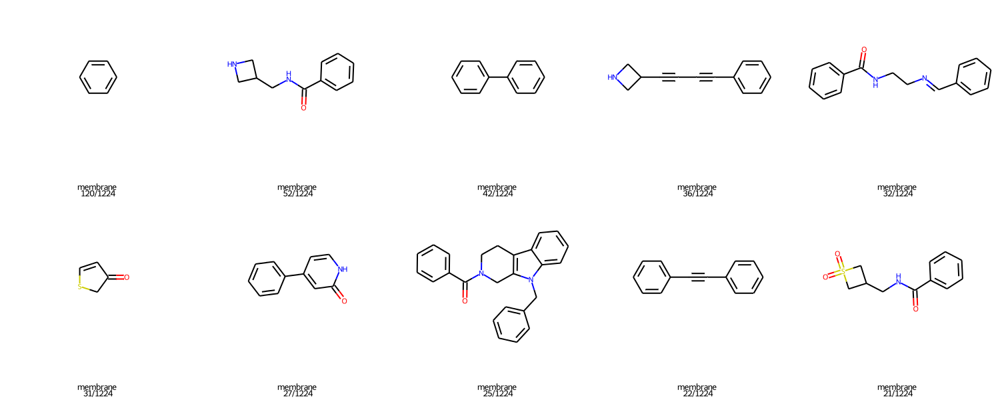

CoA synthesis
c1cc(CNc2nc3ncccc3[nH]2)cc(CC2CCNCC2)c1: 9/55
c1ccc(CCNc2ccnc3nc(NCc4ccccc4)nn23)cc1: 8/55
O=c1cc[nH]c2nc(NCc3cccc(Oc4ccccc4)c3)nn12: 2/55
O=c1cc[nH]c2nc(NCc3ccccc3)nn12: 2/55
c1cc(CNc2nc3ncccc3[nH]2)cc(CC2CCNC2)c1: 2/55
c1cc(CNc2nc3ncccc3[nH]2)cc(OC2CCNC2)c1: 2/55
c1ccc(CNc2nc3nccc(N4CCC4)n3n2)cc1: 2/55
c1ccc(CNc2nc3nccc(N4CCNCC4)n3n2)cc1: 2/55
c1ccc(CNc2nc3nccc(NCCc4cn[nH]c4)n3n2)cc1: 2/55
c1ccc(CNc2nc3nccc(Nc4ccc5c(c4)CCN5)n3n2)cc1: 2/55


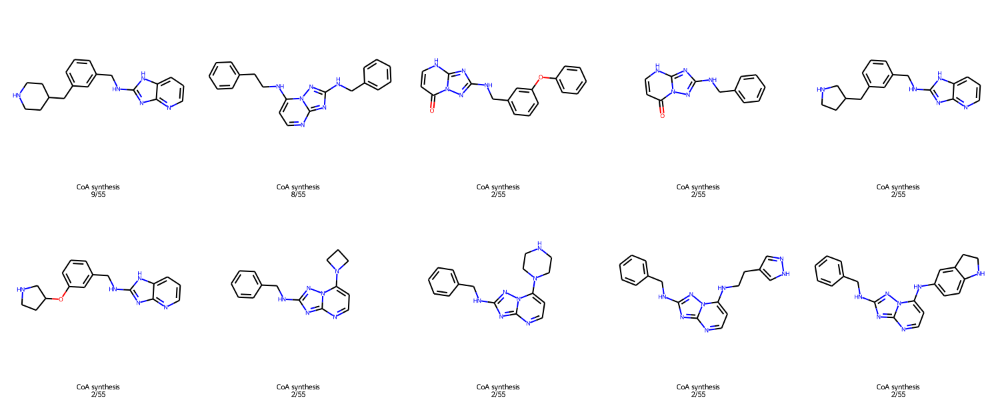

nucleic acid
O=C1CCOC(=O)c2ccccc2CSCCN1: 30/852
O=c1[nH]c2cc(-c3ccccc3)cnc2[nH]1: 24/852
O=C(NC1CCc2ncsc2C1)c1ccc[nH]1: 22/852
O=c1cc[nH]c2nc(OC3CCCCC3)ncc12: 22/852
O=c1[nH]c(=O)n(C2CC2)c2cc(N3CCCC3)ccc12: 17/852
c1cncnc1: 15/852
O=C(Nc1cc2ccc(OC3CC(OC(=O)c4ccc[nH]4)CCO3)cc2oc1=O)c1ccccc1: 14/852
O=C(Nc1nc2ccccc2s1)c1ccc[nH]1: 14/852
O=c1ccc2ccc(N3CCCC3)cc2n1C1CC1: 14/852
O=C1NC(=O)C2(Cc3cc4cnoc4cc3N3CCOCC32)C(=O)N1: 13/852


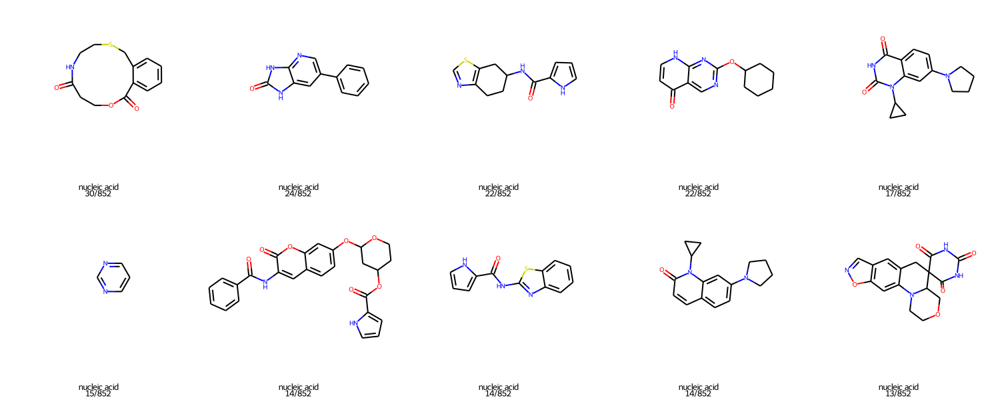

cell division
c1ccc(-c2nc(Nc3ccc(-c4nc5ccccc5[nH]4)cc3)c3ccccc3n2)cc1: 8/23
c1ccc(-c2c[nH]nc2-c2ccccc2)cc1: 5/23
C1=Nc2ccccc2C1=C(c1c[nH]c2ccccc12)c1c[nH]c2ccccc12: 1/23
C1=Nc2ccccc2C1=C(c1ccccc1)c1c[nH]c2ccccc12: 1/23
O=C(CCc1c[nH]c2ccccc12)NCC(=O)NC(Cc1c[nH]c2ccccc12)C(=O)NCC(=O)NC(Cc1c[nH]c2ccccc12)C(=O)NCC(=O)NCCc1c[nH]c2ccccc12: 1/23
O=C(Nc1ccc2[nH]c(-c3cnc4ccccc4c3)nc2c1)c1ccc(Nc2nc(-c3ccccc3)nc3ccccc23)cc1: 1/23
O=C1C=CC=CC2OC2CCOC(=O)c2ccccc2C1: 1/23
c1cc(-c2nc3ccc(-c4ccc5nc(-c6ccncc6)[nH]c5c4)cc3[nH]2)ccn1: 1/23
c1ccc(-c2[nH]ncc2-c2ccc3c(c2)OCCO3)cc1: 1/23
c1ccc(-c2cn[nH]c2-c2ccccc2)cc1: 1/23


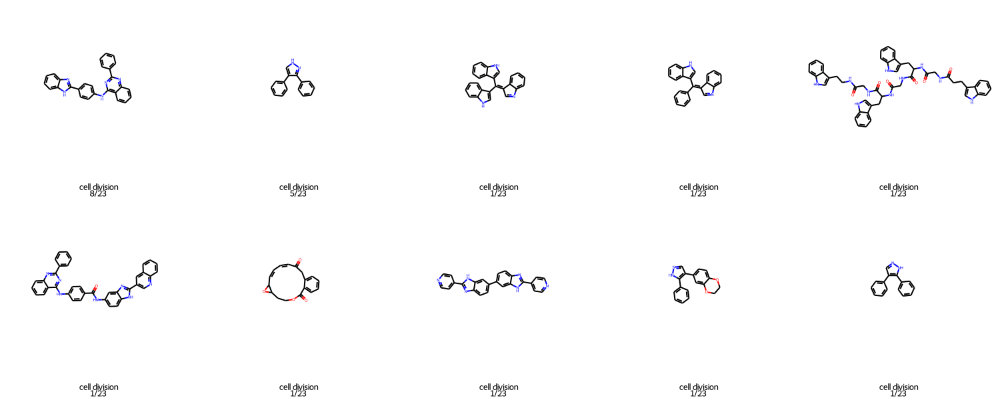

oxidative stress
O=C1OCc2c1ccc1c(=O)c3cc4c(=O)ccc(=O)c4cc3c(=O)c21: 2/14
c1ccccc1: 2/14
C(=Cc1ccccc1)c1ccccc1: 1/14
C1COCC(CC2CO2)C1: 1/14
O=C(CCc1c[nH]c2ccccc12)NCC(=O)NC(Cc1c[nH]c2ccccc12)C(=O)NCC(=O)NC(Cc1c[nH]c2ccccc12)C(=O)NCC(=O)NCCc1c[nH]c2ccccc12: 1/14
O=c1cc(-c2ccccc2)oc2ccccc12: 1/14
O=c1cccc2[nH]c3ccccc3nc1-2: 1/14
c1cc(-c2cc[nH+]cc2)cc[nH+]1: 1/14
c1ccc([As]=[As]c2ccccc2)cc1: 1/14
c1ccc2[nH+]c3ccccc3nc2c1: 1/14


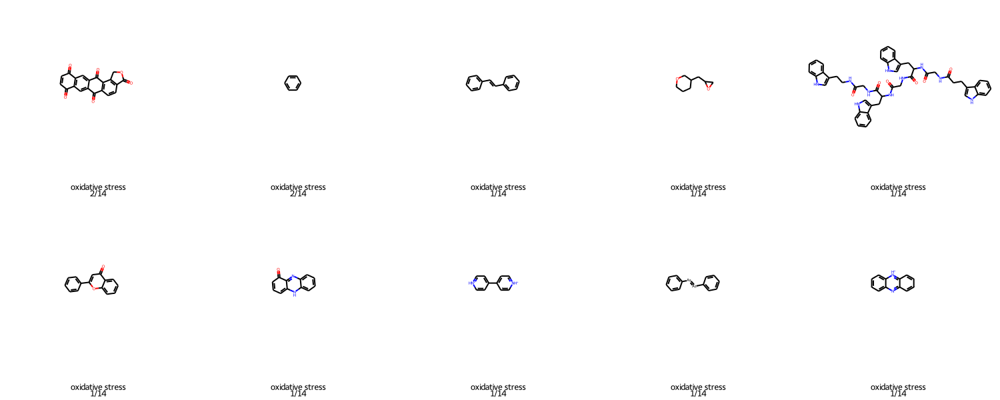

PMF
c1ccccc1: 4/49
O=C(C=Cc1ccccc1)c1ccccc1: 2/49
O=C1CC(c2ccccc2)Oc2ccccc21: 2/49
C(=C(c1ccccc1)c1ccccc1)c1ccccc1: 1/49
C(=CCn1c[nH+]c2cncnc21)CCC1CCCC2C=CCCC21: 1/49
C(=NNc1nc2ccccc2[nH]1)c1c[nH]c2ccccc12: 1/49
C1CCC(C2CCC(C3CCC(C4CCC5(CCCCO5)O4)O3)O2)OC1: 1/49
C1CCC(CC2CCCC3(CCC(C4CCC(C5CCC(C6CCCCO6)O5)O4)O3)O2)OC1: 1/49
C=C1C=C(C(=O)CC2CCCC(CCCC(=O)CC3CCC(C4CCCCO4)O3)O2)C(=O)O1: 1/49
C=C1NC(=O)CNC(=O)CCSCC(C(=O)NC2CSCC(C(=O)NCC(=O)NC3CSCC(C(=O)NCC(=O)NCC(=O)NCC(=O)NC4CSCC5NC(=O)C(CSCC(C(=O)NCC(=O)NCC(=O)NCCc6cnc[nH]6)NC(=O)C(Cc6cnc[nH]6)NC5=O)NC(=O)CNC4=O)NC(=O)CNC(=O)CNC(=O)CNC(=O)CNC(=O)CNC3=O)NC(=O)CNC(=O)C3CCCN3C2=O)NC(=O)CNC1=O: 1/49


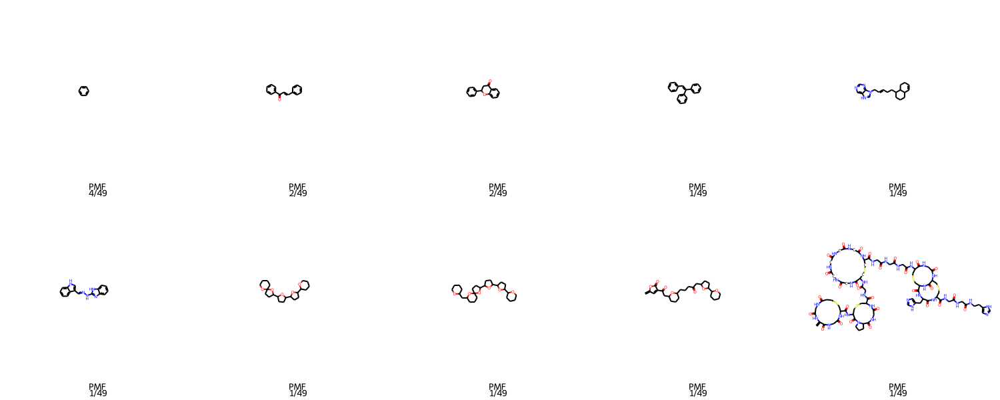

protein biosynthesis
C1CCC(OC2CCCC(OC3CCCCO3)C2)OC1: 11/144
O=C1C2=CC3C(=O)C=CCC3CC2Cc2ccccc21: 11/144
O=C1C=CC2C(=O)C3=Cc4ccccc4CC3CC2C1: 9/144
c1ccccc1: 6/144
C1=COC(OC2CCCC(OC3CCCCO3)C2)CC1: 5/144
O=C1OCCN1c1ccccc1: 3/144
c1ccc(-c2ccncn2)cc1: 3/144
C1CCC(OC2CCCCO2)CC1: 2/144
C1CCC(OC2COC(OC3CCCCC3OC3CCCCO3)C2)OC1: 2/144
C1CCNC1: 2/144


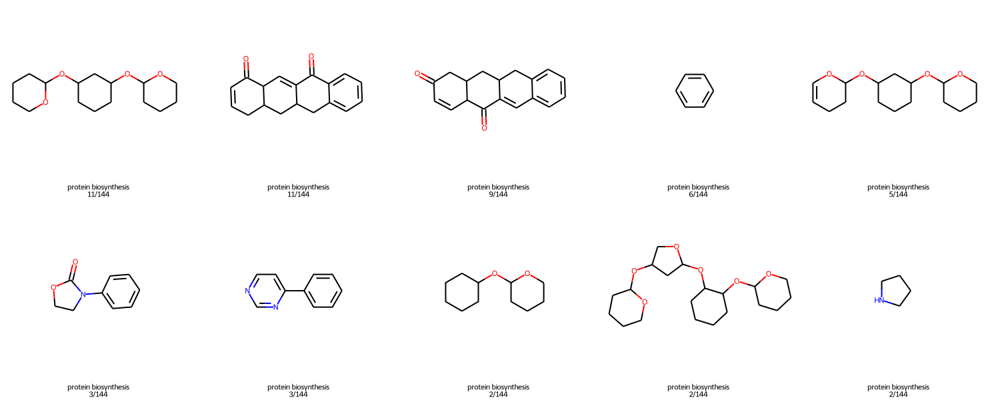

cell wall
c1ccccc1: 18/364
O=C(Cc1ccccc1)NC1C(=O)N2CCSC12: 16/364
O=c1ccn(C2CCC(COC3CCCO3)O2)c(=O)[nH]1: 16/364
O=C1Cc2cccc(c2)Oc2cccc(c2)C2NC(=O)C(Cc3ccc(cc3)Oc3cc4cc(c3)C(NC2=O)C(=O)NC2C(=O)NC(Cc3ccc(cc3)O4)C(=O)NCc3ccccc3-c3cccc2c3)N1: 14/364
N=C(C(=O)NC1C(=O)N2C=CCSC12)c1cscn1: 11/364
N=C1NCCC(CC(=O)NCC(=O)NCCCNCC(OC2CCCO2)C2CCC(n3ccc(=O)[nH]c3=O)O2)N1: 8/364
O=C1NC2C=CCN1C2: 8/364
O=C(NC1C(=O)N2CCSC12)c1conc1-c1ccccc1: 7/364
O=C1CNC(=O)C(CC2CN=CN2C2CCCCO2)NC(=O)C(CC2CN=CN2)NC(=O)C(Cc2ccc3nc(-c4ccccc4)oc3c2)NC(=O)C(Cc2ccccc2)NC(=O)CN1: 7/364
O=C(NC(c1ccccc1)c1ccc2cccnc2c1)c1ccccc1: 6/364


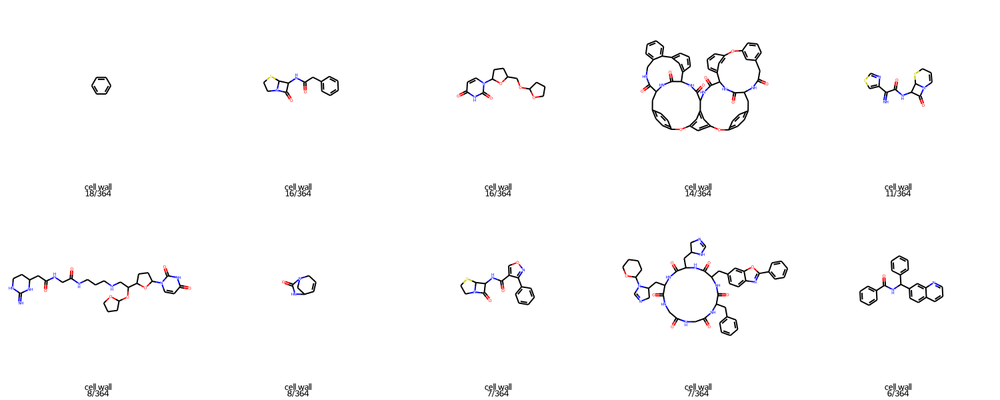

In [24]:
# sorting for highest frequency

n=10
label_set = list(set(labeled_drugs.labels))
for label in label_set:
    mols = scaffold_dict[label][1]
    smiles = [Chem.MolToSmiles(mol) for mol in mols]
    sorted_smiles = sort_by_frequency(smiles)
    sorted_smiles.reverse()
    
    while '' in sorted_smiles: sorted_smiles.remove('') # removing '' scaffolds under the assumption that they are not identical

    unique_ordered_smiles = []
    for smiles in sorted_smiles:
        if smiles not in unique_ordered_smiles:
            unique_ordered_smiles.append(smiles)
    
    scaffold_mols = [GetScaffoldForMol(Chem.MolFromSmiles(x)) for x in unique_ordered_smiles]
    
    legend = [label+'\n'+str(sorted_smiles.count(scaffold))+'/'+str(len(sorted_smiles)) for scaffold in unique_ordered_smiles[:min(n,len(unique_ordered_smiles))]]
    scaffold_img = Draw.MolsToGridImage(scaffold_mols[:min(n,len(unique_ordered_smiles))], molsPerRow=5, subImgSize=(300,300), legends=legend, returnPNG=False)
    
    print(label)
    for scaffold in unique_ordered_smiles[:min(n,len(unique_ordered_smiles))]:
        print('{}: {}/{}'.format(scaffold, sorted_smiles.count(scaffold), len(sorted_smiles)))
#         print(scaffold+':', sorted_smiles.count(scaffold)+'/{}'.format())
    scaffold_img.show()
    scaffold_img.save('../outputs/'+label+'_murcko_scaffolds.png')

# Part 8: Putative Novel Mechanisms

In [25]:
# plotting t-SNE of drugs with putatively novel MOA
labeled_drugs['hold_out'].replace('novel class','novel',inplace=True)
labeled_drugs['hold_out'].replace('novel mechanism','novel',inplace=True)
labeled_drugs['hold_out'].replace('Novel mechanism','novel',inplace=True)

novel_mask = [novelty == 'novel' for novelty in labeled_drugs['hold_out'].to_list()]
novel_moa_df = tsne_df.copy()
novel_moa_df.loc[novel_mask,'label'] += ', novel' 
fig = px.scatter(novel_moa_df, x='X', y='Y', color='label',title='t-SNE of Putatively Novel MOA Antibiotics', color_discrete_sequence=px.colors.qualitative.Alphabet)
fig.show()

# Part 9: Analyzing Held-out Brochado Set

In [26]:
### This dataset was originally intended for external validation of the models
### However, it was insufficiently dissimilar to the training set and human drugs had no ground truth labels

# Tanimoto
brochado_df = labeled_drugs.copy()
brochado_mask = [label == 'brochados' for label in brochado_df['hold_out']] 
training_mask = [label != 'brochados' for label in brochado_df['hold_out']]
temp_df = brochado_df[brochado_mask]
nonhuman_mask = [label != 'human' for label in temp_df['labels']]
brochado_smiles = temp_df.loc[nonhuman_mask,'canon_SMILES'].to_list()
brochado_labels = brochado_df[brochado_mask]['labels'].to_list()
brochado_mols = [Chem.MolFromSmiles(x) for x in brochado_smiles]
brochado_names = [name for name in brochado_df['Compound'][brochado_mask]]
brochado_fps = [Chem.RDKFingerprint(x) for x in brochado_mols if x is not None]
training_mols = [Chem.MolFromSmiles(x) for x in brochado_df['canon_SMILES'][training_mask]]
training_names = [name for name in brochado_df['Compound'][training_mask]]
training_labels = [label for label in brochado_df['labels'][training_mask]]
training_fps = [Chem.RDKFingerprint(x) for x in training_mols if x is not None]

In [27]:
# iterate over zip(names, canon_SMILES)
# make a dict from names to tuple of (MOA, tanimoto list, max tanimoto score)
# print max tanimoto and plot histogram of tanimoto list
time1 = time.perf_counter()

counter = 1
brochado_dict = {}
for compound1, fp1 in zip(brochado_names, brochado_fps):
    hist = []
    max_label = 'none'
    for compound2, fp2, label in zip(training_names, training_fps, training_labels):
        tanimoto = DataStructs.TanimotoSimilarity(fp1,fp2)
        hist.append(tanimoto)
        if tanimoto >= np.max(hist):
            max_label = label
    brochado_dict[compound1] = (hist, max_label)
    counter+=1
    print('The maximum Tanimoto similarity to the antibiotic "{}" is {} with class "{}".'.format(compound1,np.max(hist),max_label))

time2 = time.perf_counter()
print("time: {}".format(time2-time1))
print(counter)
print(len(brochado_names))
print(len(brochado_fps))
print(len(brochado_dict.keys()))

The maximum Tanimoto similarity to the antibiotic "amikacin" is 0.9622411693057247 with class "protein biosynthesis".
The maximum Tanimoto similarity to the antibiotic "gentamicin" is 1.0 with class "membrane".
The maximum Tanimoto similarity to the antibiotic "tobramycin" is 1.0 with class "protein biosynthesis".
The maximum Tanimoto similarity to the antibiotic "Linezolid" is 1.0 with class "nucleic acid".
The maximum Tanimoto similarity to the antibiotic "cefalexin" is 0.9745901639344262 with class "cell wall".
The maximum Tanimoto similarity to the antibiotic "cycloserine" is 0.2152317880794702 with class "protein biosynthesis".
The maximum Tanimoto similarity to the antibiotic "clindamycin" is 0.8847583643122676 with class "protein biosynthesis".
The maximum Tanimoto similarity to the antibiotic "Amoxicillin" is 1.0 with class "cell wall".
The maximum Tanimoto similarity to the antibiotic "Oxacillin" is 1.0 with class "cell wall".
The maximum Tanimoto similarity to the antibiotic 

In [28]:
# 10 lowest max Tanimoto similarity brochado compounds form generalization test set
k = 10
max_tanimotos = [np.max(brochado_dict[compound][0]) for compound in brochado_names]
idxs = np.argsort(max_tanimotos)
for idx in idxs[:k]:
    print(brochado_names[idx])
least_similar_smiles = pd.DataFrame()
least_similar_smiles['smiles'] = [brochado_smiles[idx] for idx in idxs[:k]]
least_similar_smiles['labels'] = [brochado_labels[idx] for idx in idxs[:k]]
least_similar_smiles['max_tanimotos'] = [max_tanimotos[idx] for idx in idxs[:k]]
least_similar_smiles['Compound'] = [brochado_names[idx] for idx in idxs[:k]]
least_similar_smiles['idxs'] = idxs[:k]
least_similar_smiles.to_csv('../data/brochado_generalization_test.csv')

Fosfomycin
cycloserine
CCCP
Paraquat
Cerulenin
Chlorhexidine
Triclosan
Phenazine methosulfate
Benzalkonium
Pyocyanin


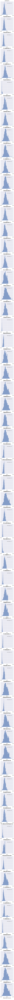

In [29]:
# plotting Tanimoto distributions
axis_coords = range(0,len(brochado_names))
fig, axes = plt.subplots(len(brochado_names), 1, figsize=(5,6*len(brochado_names)), sharey=False, sharex=False)
for coords, compound in zip(axis_coords, brochado_names):
    axes[coords] = sns.histplot(ax = axes[coords], x=brochado_dict[compound][0],binrange=(0,1))
    axes[coords].set_title(compound)
    axes[coords].set_xlabel('Tanimoto Score\n')
    axes[coords].set_ylabel('')
    axes[coords].axes.yaxis.set_ticklabels([])
    maximum = 'Max Similarity: '+str(np.max(brochado_dict[compound][0]))[0:4]
    plt.text(0.5, 0.85, maximum, transform=axes[coords].transAxes, fontsize=10)

In [30]:
# 3D tsne of brochado set
print(set(labeled_drugs['hold_out']))
brochado_mask = [label == 'brochados' for label in labeled_drugs['hold_out']]
brochado_df = threeD_tsne_df.copy()
# brochado_df['label'][brochado_mask] = 'brochado'
# Uncomment below to get specific labels of brochado cpds
brochado_df.loc[brochado_mask,'label'] += ', Brochado'
brochado_df.loc[brochado_mask,'max_similarity'] = [np.max(brochado_dict[compound][0]) for compound in brochado_df.loc[brochado_mask,'compound']]
brochado_df.loc[brochado_mask,'max_similarity_class'] = [brochado_dict[compound][1] for compound in brochado_df.loc[brochado_mask,'compound']]

{nan, 'brochados', 'putative MOA', 'novel'}


In [31]:
# 3D tsne plot of brochado compounds excluding human drugs
fig = px.scatter_3d(brochado_df, x='X', y='Y', z='Z', color='label',title='t-SNE of Held Out Antibiotics from Brochado et al.', color_discrete_sequence=px.colors.qualitative.Alphabet,hover_data=['max_similarity','max_similarity_class'], opacity=0.7)
fig.show()

In [32]:
# t-SNE
brochado_df = tsne_df.copy()
brochado_df['compound'] = labeled_drugs['Compound'].to_list()
# brochado_df['label'][brochado_mask] = 'brochado'
# Uncomment below to get specific labels of brochado cpds
brochado_df.loc[brochado_mask,'label'] += ', brochado'
brochado_df.loc[brochado_mask,'max_similarity'] = [np.max(brochado_dict[compound][0]) for compound in brochado_df.loc[brochado_mask,'compound']]
brochado_df.loc[brochado_mask,'max_similarity_class'] = [brochado_dict[compound][1] for compound in brochado_df.loc[brochado_mask,'compound']]
fig = px.scatter(brochado_df, x='X', y='Y', color='label',title='t-SNE of Held Out Antibiotics from brochado et al.', color_discrete_sequence=px.colors.qualitative.Alphabet,hover_data=['max_similarity','max_similarity_class'], opacity=0.7)
fig.show()

/home/gcai/anaconda3/envs/abx_moa/lib/python3.8/site-packages/rdkit/Chem/Draw/IPythonConsole.py:190: UserWarning:

Truncating the list of molecules to be displayed to 30. Change the maxMols value to display more.



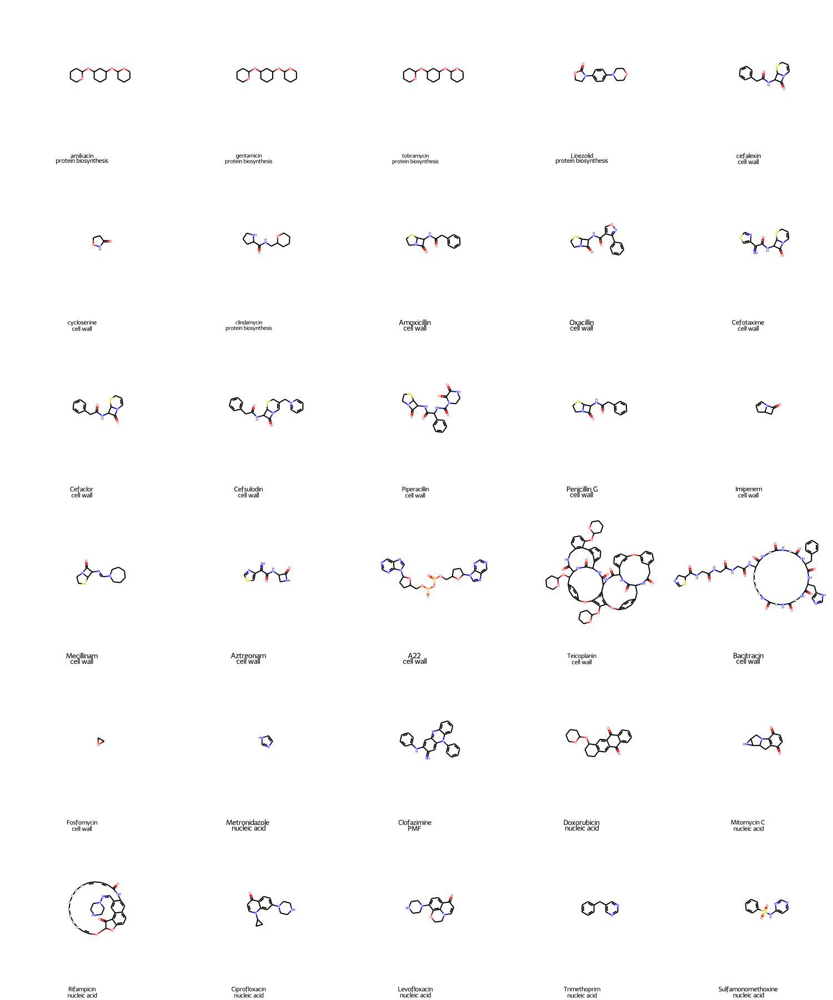

In [33]:
# showing Murcko scaffolds from brochado set
brochado_scaffolds_df = labeled_drugs.copy()
brochado_scaffolds = [Chem.MolFromSmiles(MurckoScaffoldSmiles(smiles)) for smiles in brochado_scaffolds_df['canon_SMILES'][brochado_mask]]
brochado_scaffold_legend = [name+'\n'+label for name, label in zip(brochado_scaffolds_df['Compound'][brochado_mask],brochado_scaffolds_df['labels'][brochado_mask])]
scaffold_img = Draw.MolsToGridImage(brochado_scaffolds, molsPerRow=5, subImgSize=(300,300), returnPNG=False, maxMols=30, legends=brochado_scaffold_legend)
scaffold_img.show()

label_set: ['membrane', 'CoA synthesis', 'nucleic acid', 'cell division', 'oxidative stress', 'PMF', 'protein biosynthesis', 'cell wall']


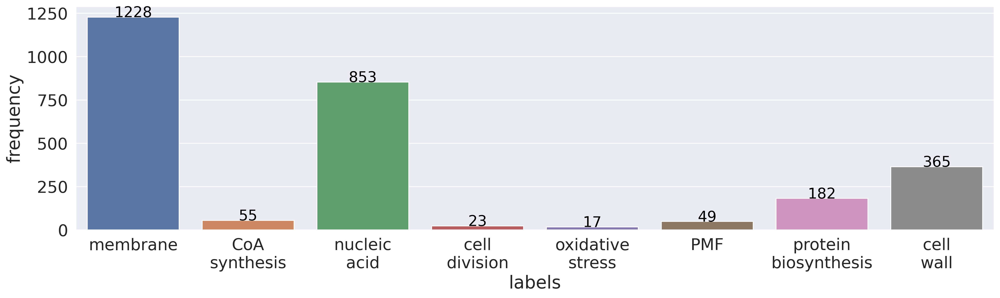

In [34]:
# class balance of remaining non-held out compounds

nonbrochado_mask = [label != 'brochado' for label in labeled_drugs['hold_out']]
nonbrochado_drugs = labeled_drugs[nonbrochado_mask]

labelset = list(set(nonbrochado_drugs['labels']))
print('label_set:',label_set)
label_set = []
for label in labelset:
    label_set.append(label.replace(' ','\n'))
# label_set = ['cell wall','membrane','nucleic acid','protein\nbiosynthesis','oxidative stress','PMF','cell\ndivision']
frequencies = []
for label in labelset:
    frequencies.append(nonbrochado_drugs['labels'].to_list().count(label))
class_balance_df = pd.DataFrame()
class_balance_df['labels'] = label_set
class_balance_df['frequency'] = frequencies
fig = plt.figure(figsize=(20,5), dpi = 300)
ax = sns.barplot(x="labels", y="frequency", data=class_balance_df, )
for p in ax.patches:
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
    ha='center', va='center', fontsize=18, color='black', xytext=(0, 5),
    textcoords='offset points')
# fig.savefig('../outputs/nonbrochado_class_balance.png')

# Part 10: Analyzing Cellular Targets

In [35]:
# loading in labeled targets
data_dir = '../data/'
file_name = 'abx_targets_labeled.csv'
file_path = data_dir+file_name

drugs = pd.read_csv(file_path)
print('initial length:',len(drugs))
not_nans = [type(smi) != float for smi in list(drugs['canon_SMILES'])]
drugs = drugs[not_nans] # filter for having SMILE
print('filtered for SMILES:',len(drugs))

labeled = [target != 'unknown' for target in list(drugs['cleaned_targets'])]
labeled_drugs = drugs[labeled] # filter labeled drugs i.e. not unknown
# print(labeled_drugs.shape)
labeled_drugs = multiple_labels(labeled_drugs,'cleaned_targets') # dealing with multiple targets
print(labeled_drugs.shape)

initial length: 2813
filtered for SMILES: 2813
(2264, 16)


<ipython-input-2-18b7ff8f9832>:35: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [36]:
# making fingerprints and computing PCA
labeled_mols = [Chem.MolFromSmiles(x) for x in labeled_drugs['canon_SMILES']]
labeled_fps = [Chem.RDKFingerprint(x) for x in labeled_mols if x is not None]

pca = PCA(n_components=2)
crds = pca.fit_transform(labeled_fps)
crds_df = pd.DataFrame(crds,columns=["PC_1","PC_2"])
crds_df['target'] = labeled_drugs['cleaned_targets'].to_list()

print('variance explained by pc1+pc2: ' + str(np.sum(pca.explained_variance_ratio_)))

variance explained by pc1+pc2: 0.19508459838397882


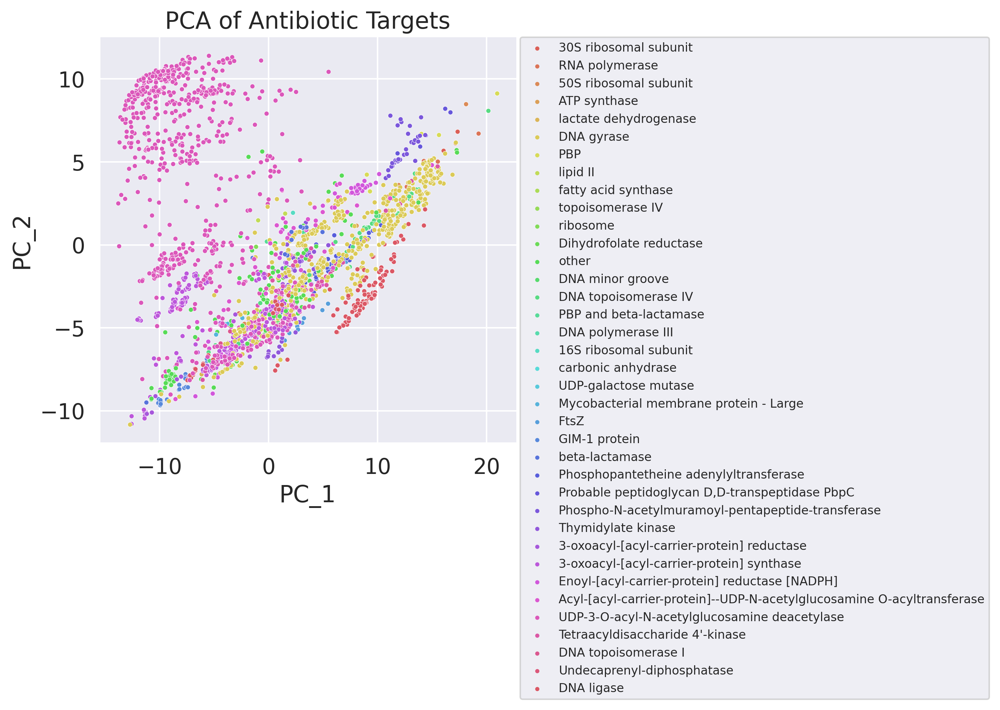

In [37]:
# plotting PCA
sns.set(font_scale=1.3)  # increase font size
fig = plt.figure(figsize=(5,5), dpi = 300)

ax = sns.scatterplot(data=crds_df,x="PC_1",y="PC_2",hue="target", palette=sns.color_palette("hls", len(set(crds_df['target']))), s=10)
ax.set(title='PCA of Antibiotic Targets')
plt.legend(bbox_to_anchor=(1.01, 1),
           borderaxespad=0, fontsize=8, markerscale=0.3)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

fig.savefig('../outputs/abx_targets_PCA.png')

In [38]:
# computing t-SNE
pca = PCA(n_components=50)
crds = pca.fit_transform(labeled_fps)

%time crds_embedded = TSNE(n_components=2).fit_transform(crds)

target_tsne_df = pd.DataFrame(crds_embedded,columns=["X","Y"])
target_tsne_df['target'] = labeled_drugs['cleaned_targets'].to_list()

CPU times: user 5min 6s, sys: 2.48 s, total: 5min 9s
Wall time: 2min 21s


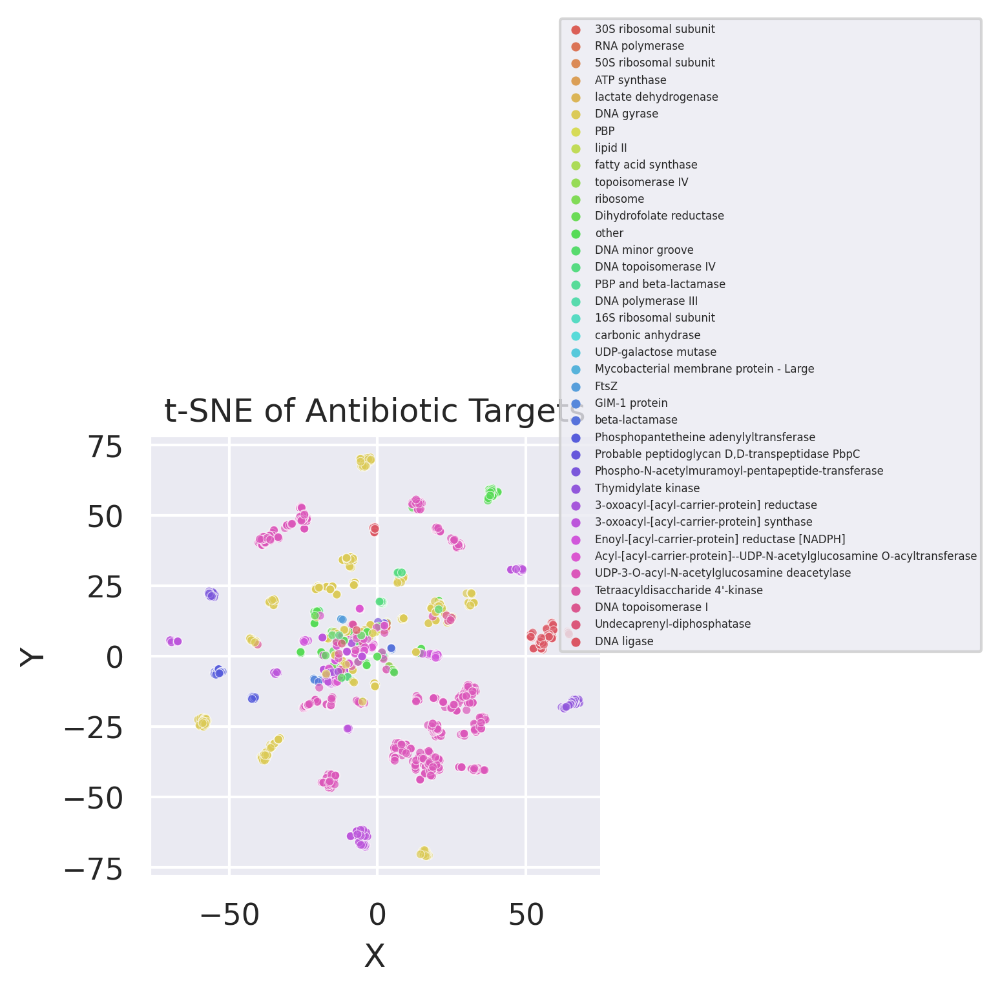

In [39]:
# plotting t-SNE
sns.set(font_scale=1)  # increase font size
fig = plt.figure(figsize=(3,3), dpi = 300)
ax = sns.scatterplot(data=target_tsne_df,x="X",y="Y",hue="target", alpha = 0.7,palette=sns.color_palette("hls", len(set(target_tsne_df['target']))), s = 10)
ax.set(title='t-SNE of Antibiotic Targets')    
plt.legend(loc='best', bbox_to_anchor=(0.9, 0.5, 0.5, 0.5), fontsize=4, markerscale=0.4,)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)
fig.savefig('../outputs/abx_targets_tSNE.png',bbox_inches='tight')

In [40]:
# You can click on the legend to flexibly select classes to show
fig = px.scatter(target_tsne_df, x='X', y='Y', color='target',title='t-SNE of Antibiotics', color_discrete_sequence=px.colors.qualitative.Alphabet)
fig.show()

# Part 11: t-SNE of targets of cell wall labeled MOA

In [41]:
# isolating for cell wall MOA labels; analyzing specific cellular targets
cellwall_drugs = pd.read_csv('../data/abx_targets_labeled.csv')
wall_mask = [label == 'cell wall' for label in cellwall_drugs['labels']]
wall_drugs = cellwall_drugs[wall_mask]
wall_mols = [Chem.MolFromSmiles(x) for x in wall_drugs['canon_SMILES']]
wall_fps = [Chem.RDKFingerprint(x) for x in wall_mols if x is not None]
# wall_drugs

In [42]:
# computing PCA and t-SNE
pca = PCA(n_components=50)
crds = pca.fit_transform(wall_fps)

%time crds_embedded = TSNE(n_components=2).fit_transform(crds)

wall_tsne_df = pd.DataFrame(crds_embedded,columns=["X","Y"])
wall_tsne_df['target'] = wall_drugs['cleaned_targets'].to_list()

CPU times: user 5min 2s, sys: 5.15 s, total: 5min 8s
Wall time: 1min 48s


In [43]:
# You can click on the legend to flexibly select classes to show
fig = px.scatter(wall_tsne_df, x='X', y='Y', color='target',title='t-SNE of Antibiotics', color_discrete_sequence=px.colors.qualitative.Alphabet)
fig.show()

# Part 12: Cleaning MIC data

In [44]:
# reading MIC data
MIC_file_path = '../data/'
df = pd.read_csv(MIC_file_path + 'SPARK_MIC_Data.csv')
labeled_drugs = nonhuman_drugs.copy()

/home/gcai/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3169: DtypeWarning:

Columns (2,3,16,23,24,25,26,28,29,35,38,39,41,43,44,45,46,47,48,49,50,52,53,54,55,56,57,58,59,60,61,63,64,65,66,67,69,70,72,73,74,75,76) have mixed types.Specify dtype option on import or set low_memory=False.



In [45]:
# isolating useful columns
df = df[['SMILES',
                 'Curated & Transformed MIC Data: Subset Conditions',
                 'Curated & Transformed MIC Data: Subset Person',
                 'Curated & Transformed MIC Data: MIC (µg/mL)']]
spk_df = pd.DataFrame()
spk_df['SMILES'] = df['SMILES'].to_list()
spk_df['paper'] = df['Curated & Transformed MIC Data: Subset Conditions'].to_list()
spk_df['author'] = df['Curated & Transformed MIC Data: Subset Person'].to_list()
spk_df['MIC'] = df['Curated & Transformed MIC Data: MIC (µg/mL)'].to_list()
spk_df.head()

,SMILES,paper,author,MIC
0,OB1OCC2=CC=CC(OCCC[N+]3=CC=CC=C3)=C12,NaN,NaN,NaN
1,OB1OCC2=CC=CC(OCCC[N+]3=CC=CC=C3)=C12,Compound Uptake into E. coli Can Be Facilitate...,Perlmutter 2020 ACS Infect. Dis. 7:162,> 32.0
2,OB1OCC2=CC=CC(OCCC[N+]3=CC=CC=C3)=C12,Compound Uptake into E. coli Can Be Facilitate...,Perlmutter 2020 ACS Infect. Dis. 7:162,16
3,OB1OCC2=CC=CC(OCCC[N+]3=CC=CC=C3)=C12,Compound Uptake into E. coli Can Be Facilitate...,Perlmutter 2020 ACS Infect. Dis. 7:162,> 32.0
4,NC(=[NH2+])NCCCOC1=C2B(O)OCC2=CC=C1,NaN,NaN,NaN


In [46]:
# dropping compounds with no MIC
spk_df.dropna(axis=0,subset=['SMILES', 'MIC'],inplace=True)
spk_df.replace('< ','0',inplace=True,regex=True)
spk_df.replace('<= ','0',inplace=True,regex=True)
MIC_mask = ['>' not in MIC for MIC in spk_df.MIC]
spk_df = spk_df[MIC_mask]
MIC_mask = [float(MIC)<=128 for MIC in spk_df.MIC]
spk_df = spk_df[MIC_mask]

In [47]:
# check that no MIC values >128
sum([float(MIC)>128 for MIC in spk_df['MIC']])

0

In [48]:
# check that MIC values <= 128
for MIC in set(spk_df.MIC):
    if float(MIC) > 128:
        print('oops')

In [49]:
# filtering for labels

# note that these filtered out abx (no MOA label) can be used later as experimentally validated set?
set(spk_df.paper)
unlabeled = ['A Common Platform for Antibiotic Dereplication and Adjuvant Discovery\r\n\r\nDOI: http://dx.doi.org/10.1016/j.chembiol.2016.11.011',
'A High-Throughput Screen Identifies a New Natural Product with Broad-Spectrum Antibacterial Activity\r\n\r\nDOI: https://doi.org/10.1371/journal.pone.0031307\r\n\r\nExperimental conditions (except for M. tuberculosis):\r\nInoculum: 5x10^5 CFU/mL from log-phase culture;\r\nPlates: 96 well, 100 uL, CAMHB; \r\nIncubation: 37C o/n;\r\nReadout: Visual.\r\n\r\nExperimental conditions for M. tuberculosis:\r\nInoculum: 2x10^4 cells;\r\nPlates: 96-well, 200 uL, 7H9-Casein-ADC media;\r\nIncubation: 37C, >6 days\r\nDetection method: Alamar blue assay\r\nReadout: Ex550, Em595, MIC ≧90% inhibition.',
'A Synthetic Dual Drug Sideromycin Induces Gram-Negative Bacteria To Commit Suicide with a Gram-Positive Antibiotic.\r\n\r\nDOI: https://dx.doi.org/10.1021/acs.jmedchem.8b00218',
'Biofilm inhibition of linezolid-like Schiff bases: synthesis, biological activity, molecular docking and in silico ADME prediction.\r\n\r\nDOI: https://dx.doi.org/10.1016/j.bmcl.2014.12.063',
'Breaking the Permeability Barrier of Escherichia coli by Controlled Hyperporination of the Outer Membrane\r\n\r\nDOI: https://doi.org/10.1128/AAC.01882-16',
'ChEMBL 23 Data (E coli ATCC 25922) \r\nExtracted by Johannes Zuegg',
'Combined inactivation of lon and ycgE decreases multidrug susceptibility by reducing the amount of OmpF porin in Escherichia coli\r\n\r\nDOI: https://dx.doi.org/10.1128/aac.00787-09\r\n\r\nMICs determined by Etest; results reported as mean of >= 4 measurements\r\n\r\nPlasmid maintenance and induction:\r\npMPM (DL006, DL007): 20 µg/ml tetracycline and 1.3 mM L-arabinose\r\npET21b with pACT7Sp (DL008, DL009): 100 µg/ml ampicillin, 50 µg/ml spectinomycin, and 0.1 mM IPTG.',
'Compound Uptake into E. coli Can Be Facilitated by N-Alkyl Guanidiniums and Pyridiniums\r\n\r\nDOI: https://dx.doi.org/10.1021/acsinfecdis.0c00715',
'Contributed April 2019.\r\n\r\nEfflux Panel Data: screening of nearly 200 antibiotics, many of which have been approved for human use, against 22 bacterial strains to identify the common properties of drugs effective at evading efflux pumps. \r\n\r\nAntibacterial activity was assessed using a broth microdilution assay following the recommended methodology of the Clinical and Laboratories Institute (CLSI) (CLS M7).',
'Contributed August 2019\r\n\r\nExperimental Conditions: \r\nPlates: 384w NBS 50uL \r\nInoculum: o/n subculture, 5x10^5 CFU/mL \r\nIncubation: 18h 37C \r\nReadout: OD600',
'Contributed December 2019\r\n\r\nExperimental Conditions:\r\nPlates: 384w NBS 50uL;\r\nInoculum: o/n subculture, 5x10^5 CFU/mL;\r\nIncubation: 18h 37C;\r\nReadout: OD600',
'Contributed November 2018.\r\n\r\n//\r\n\r\nLpxA MIC Assay\r\n\r\n//\r\n\r\nAntibacterial activity was assessed using a broth microdilution assay following the recommended methodology of the Clinical and Laboratories Institute (CLSI) (CLS M7).\r\n\r\n//\r\n\r\nLpxADK Bacterial Growth Inhibition (GIC) Assay\r\n\r\n//\r\n\r\nThis is a high-throughput density-based optical assay that detects bacterial cell growth following treatment with compounds. Results are reported as the compound concentration resulting in 50% growth inhibition compared to the 100% inhibition control. The 50% Growth Inhibitory Concentration (GIC50) was calculated using a dose response curve.\r\n\r\n//\r\n\r\nAdditional GIC calculation details are described in Gubler (2006) Methods for Statistical Analysis, Quality Assurance and Management of Primary High-Throughput Screening Data. High-Throughput Screening in Drug Discovery; Volume 35, Chapter 7. Wiley-VCH GmbH Weinheim, Germany. https://doi.org/10.1002/9783527609321.ch7\r\n\r\n//\r\n\r\nAdditional strain information from curator:\r\n\r\n- CGSC 11430 is a mutant from the Keio collection that is efflux-deficient because the tolC gene is inactivated\r\n\r\n- CGSC 14179 contains a short in-frame deletion in the lptD gene (previously known as the imp gene) resulting in a strain with a defect in the LPS export system, causing the outer membrane to be hyperpermeable thus making it hypersensitive to antibiotics. Ref: Sampson 1989 Genetics 122:491-501 PMID: 2547691\r\n\r\n- CGSC 7636 is a well-characterized laboratory strain; parent strain for the Keio Collection of single gene knockouts\r\n\r\n- ATCC 35151 is a strain produced by chemical mutagenesis of strain K799 (ATCC 12055) and screening for antibiotic sensitivity. It has a hyperpermeable outer membrane and probably also is efflux-deficient. Ref: Angus 1982 Antimicrob Agents Chemother 21:299–309 PMID: 6803666\r\n\r\n- K1119 was derived from PAO1 by deletion of the major RND efflux pump and is thus Efflux-deficient. Li 1998 Antimicrob Agents Chemother 42:399–403 PMID: 9527793\r\n\r\nUpdate (02/2020): Strain alternate IDs for ATCC25922 (NB27001) and PAO1 (NB52019) updated to include Novartis identifiers.',
'Development of Antibiotic Activity Profile Screening for the Classification and Discovery of Natural Product Antibiotics\r\n\r\nDOI: https://doi.org/10.1016/j.chembiol.2012.09.014',
'Early stage efficacy and toxicology screening for antibiotics and enzyme inhibitors\r\n\r\n//\r\n\r\nDOI: https://doi.org/10.1177/1087057112438769\r\n\r\n//\r\n\r\nMIC Assay\r\n\r\n//\r\n\r\nAntibacterial activity was assessed using a microbroth dilution assay following methods described in the references listed below. MIC was determined following addition of alamarBlue to treated samples and defined as the lowest concentration of antibiotic resulting in less than or equal to 10% of the growth of the control treated only with the vehicle.\r\n\r\n//\r\n\r\nReferences: \r\n\r\nTaneja NK and Tyagi JS. 2007 J. Antimicrob. Chemother. 60(2):288. https://doi.org/ 10.1093/jac/dkm207\r\nPeternel L, et al. 2009 J. Biomol. Screen. 14(2):142. https://doi.org/ 10.1177/1087057108329452\r\n\r\n//\r\n\r\nGrowth Inhibition (GIC) Assay\r\n\r\n//\r\n\r\nResults are reported as the compound concentration resulting in 50% growth for GIC50 or 10% growth for the GIC90 compared to the vehicle-treated control. The GIC was calculated using linear interpolation.',
 'Effect of MexXY overexpression on ceftobiprole susceptibility in Pseudomonas aeruginosa.\r\n\r\nDOI: https://dx.doi.org/10.1128/aac.00018-09',
 'Efflux pumps are involved in the defense of Gram-negative bacteria against the natural products isobavachalcone and diospyrone\r\n\r\nDOI: https://dx.doi.org/10.1128/aac.01533-09\r\n\r\nExperimental Conditions\r\nPlates: 96-well microtiter\r\nInoculum: 1.5 x 10^6 CFU/mL\r\nIncubation: 37C for 18 hours\r\nMedia: MHB\r\nReadout: colorimetric - 40 µl of 0.2 mg/mL INT; confirmed visually by complete inhibition of growth\r\nAdditives: with and without 20 µg/mL PAβN',
 'Evaluating LC-MS/MS To Measure Accumulation of Compounds within Bacteria\r\nDOI: https://doi.org/10.1021/acsinfecdis.8b00083',
 'Fmt bypass in Pseudomonas aeruginosa causes induction of MexXY efflux pump expression.\r\n\r\nDOI: https://dx.doi.org/10.1128/aac.00253-09',
 'Functional cloning and characterization of the multidrug efflux pumps NorM from Neisseria gonorrhoeae and YdhE from Escherichia coli\r\n\r\nDOI: https://dx.doi.org/10.1128/aac.00475-08\r\n\r\nExperimental Conditions:\r\nInoculum: 10^4 CFU per spot\r\nMedia: LB agar\r\nIncubation: 37C for 18-24 h\r\nAssays were repeated at least 4 times',
 'High-throughput screening of a diversity collection using biodefense category A and B priority pathogens.\r\n\r\nDOI: https://doi.org/10.1177/1087057112448216',
 'Hybrid Antibiotic Overcomes Resistance in P. aeruginosa by Enhancing Outer Membrane Penetration and Reducing Efflux.\r\n\r\nDOI: https://dx.doi.org/10.1021/acs.jmedchem.6b00867',
 'Identification and Structure-Activity Relationships of Novel Compounds that Potentiate the Activities of Antibiotics in Escherichia coli.\r\n\r\nDOI: https://dx.doi.org/10.1021/acs.jmedchem.7b00453',
 'Interplay between drug efflux and antioxidants in Escherichia coli resistance to antibiotics.\r\n\r\nDOI: https://dx.doi.org/10.1128/aac.00719-10',
 'Meridianin D Analogues Display Antibiofilm Activity against MRSA and Increase Colistin Efficacy in Gram-Negative Bacteria.\r\n\r\nDOI: https://dx.doi.org/10.1021/acsmedchemlett.8b00161',
 'New β-lactam – Tetramic acid hybrids show promising antibacterial activities\r\n\r\nDOI: https://doi.org/10.1016/j.bmcl.2018.07.018',
 'Physicochemical properties of antibacterial compounds: implications for drug discovery\r\nDOI: https://doi.org/10.1021/jm700967e',
 'Single nucleotide polymorphism analysis of the major tripartite multidrug efflux pump of Escherichia coli: functional conservation in disparate animal reservoirs despite exposure to antimicrobial chemotherapy.\r\n\r\nDOI: https://dx.doi.org/10.1128/aac.01126-09',
 'Small molecule adjuvants that suppress both chromosomal and mcr-1 encoded colistin-resistance and amplify colistin efficacy in polymyxin-susceptible bacteria.\r\n\r\nDOI: https://dx.doi.org/10.1016/j.bmc.2017.08.055',
 'Substrate competition studies using whole-cell accumulation assays with the major tripartite multidrug efflux pumps of Escherichia coli\r\n\r\nDOI: https://dx.doi.org/10.1128/aac.01048-06\r\n\r\n\r\nExperimental Conditions:\r\nPlates: 96-well flat-bottom microtiter\r\nInoculum: 5ul from mid-log phase cultures into 150ul broth\r\nMedia: LB\r\nIncubation: 24h; 37C\r\nReadout: Visual\r\nStarting CFU count not stated but all culture densities were standardized.',
 'Sec- and Tat-dependent translocation of beta-lactamases across the Escherichia coli inner membrane\r\n\r\nDOI: https://dx.doi.org/10.1128/aac.00642-08\r\n\r\nMICs performed following Comité de l’Antibiogramme de la Française de Microbiologie (CA-SFM) methods', 'ETX2514 is a broad-spectrum β-lactamase inhibitor for the treatment of drug-resistant Gram-negative bacteria including Acinetobacter baumannii.\r\n\r\nDOI: https://doi.org/10.1038/nmicrobiol.2017.104',
             'Repurposing Hsp90 inhibitors as antibiotics targeting histidine kinases.\r\n\r\nDOI: https://dx.doi.org/10.1016/j.bmcl.2017.10.036',
'Synthesis, antibiotic activity and structure-activity relationship study of some 3-enaminetetramic acids.\r\n\r\nDOI: https://dx.doi.org/10.1016/j.bmcl.2014.03.013'
            ]
# muraymycin = cell wall inhib
# LolA = lipoprotein chaperone
# Left off at Interplay between drug efflux
# pacidamycin = cell wall synth
# MBX 1066, MBX 1090 = DNA synth
# histidine kinase: https://pubs.acs.org/doi/10.1021/cb5007135
# lactivicin targets PBP (cell wall)
# negamycin = protein synth
# quinzolinone = PBP / cell wall, but non B-lactam
# Temporin L = PMF
# thiolactomycin = fatty acid synth
# divin = cell division
# octapeptin C4 = membrane
# peptide and schiff bases = PSB = membrane
# 3-enaminetetramic acids = nucleic acid

In [50]:
# selecting major screening set names for labeling
# print(set(spk_df.author))
pos_authors = [ 'Achaogen - LpxC, benchmarks',
 'Achaogen - LpxC, inhibitors',
 'Merck & Kyorin - GyrAB/ParCE inhibitors',
 'Novartis - GyrAB Growth Inhibition',
 'Novartis - LpxADK Growth Inhibition']

In [51]:
# filtering for labeled compounds
label_mask = [label not in unlabeled or label2 in pos_authors for label, label2 in zip(spk_df['paper'].to_list(),spk_df['author'].to_list())]
labeled_spk_df = spk_df[label_mask]

In [56]:
# canonizing SMILES and deduplicating
canon_SMILES = [canon_smiles(smiles) for smiles in labeled_spk_df['SMILES'].to_list()]
labeled_spk_df['canon_SMILES'] = canon_SMILES
labeled_spk_df.drop_duplicates(subset=['canon_SMILES'],inplace=True)

<ipython-input-56-f0df747724d1>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-56-f0df747724d1>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [57]:
# making a dictionary to map from titles to MOA labels
set(labeled_spk_df.paper)
title_MOA = {
    'FabI':'membrane',
    'acetyl-CoA carboxylase':'membrane',
    'Cysteine':'protein biosynthesis',
    'Alkyloxytryptamines':'membrane',
    'Riboswitch':'riboswitch',
    'cell wall':'cell wall',
    'Polymyxin':'membrane',
    'Muraymycin':'cell wall',
    'enaminetetramic':'nucleic acid',
    'ketoacyl-acyl carrier protein':'membrane',
    'LpxC':'membrane',
    'Gyrase':'nucleic acid',
    'lipopolysaccharide':'membrane',
    'GyrAB':'nucleic acid',
    'GyrB':'nucleic acid',
    'gyrase':'nucleic acid',
    'Topoisomerase Inhibitor':'nucleic acid',
    'tRNA Synthetase':'protein biosynthesis',
    'quinolone':'nucleic acid',
    'topoisomerase type II':'nucleic acid',
    'Pacidamycins':'cell wall',
    'pacidamycin':'cell wall',
    'Cell Wall':'cell wall',
    'FabK':'membrane',
    'MBX 10':'nucleic acid',
    'Conjugated Monocarbam':'cell wall',
    'lactivicin':'cell wall',
    'Negamycin':'protein biosynthesis',
    'Quinazolinone':'cell wall',
    'temporin L':'PMF',
    'MAC13243':'membrane, cell wall',
    'thiolactomycin':'membrane',
    'topoisomerase':'nucleic acid',
    'cell division':'cell division',
    'Ciprofloxacin':'nucleic acid',
    'Gyrase':'nucleic acid',
    'FabH':'membrane',
    'octapeptin':'membrane',
    'peptide and Schiff':'membrane',
    'PSB':'membrane',
    'olympicin A':'PMF, nucleic acid',
    'LpxA':'membrane',
    'lipopolysaccharide ':'membrane',
    'usnic acid':'PMF, nucleic acid',
    'Phosphopantetheine Adenylyltransferase':'CoA synthesis'
}

In [58]:
# adding labels to df
keylist=list(title_MOA.keys())

labeled_spk_df['label'] = ['' for i in range(len(labeled_spk_df))]
for idx in range(len(labeled_spk_df)):
    for key in keylist:
        if key in labeled_spk_df['paper'].iloc[idx]:
#             if author_MOA[key] != '' and author_MOA[key] != labeled_spk_df['label'].iloc[idx]:
# #                 print(str(idx)+':',str(key))
            labeled_spk_df.iloc[idx,5] = title_MOA[key]
            

<ipython-input-58-551d8c25b1d6>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/gcai/anaconda3/envs/abx_moa/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [59]:
# checking all compounds are labeled
no_label_mask = [False if label else True for label in labeled_spk_df.label]
labeled_spk_df[no_label_mask].head(10)

,SMILES,paper,author,MIC,canon_SMILES,label


In [60]:
set(labeled_spk_df.label)

{'CoA synthesis',
 'PMF',
 'PMF, nucleic acid',
 'cell division',
 'cell wall',
 'membrane',
 'membrane, cell wall',
 'nucleic acid',
 'protein biosynthesis',
 'riboswitch'}

In [61]:
canon_SMILES = labeled_spk_df['canon_SMILES'].to_list()
labels = labeled_spk_df['label'].to_list()

In [62]:
# sorted through all the duplicates with different labels, so if this labeled_spk_df is appended, can keep first / drop last
counter = 0
for idx1, drug1 in enumerate(labeled_spk_df['canon_SMILES']):
    for idx2, drug2 in enumerate(all_drugs['canon_SMILES']):
        if drug1==drug2 and labels[idx1]!= all_drugs['labels'].iloc[idx2]:
#             print(labeled_spk_df['SMILES'].iloc[idx1])
#             print(drug1)
#             print(all_drugs['labels'].iloc[idx2])
#             print(labels[idx1])
            counter+=1
print(counter)


26


In [63]:
# removing overlap between training set and external validation set
droplist=[]
for idx1, drug1 in enumerate(labeled_spk_df['canon_SMILES']):
    for idx2, drug2 in enumerate(all_drugs['canon_SMILES']):
        if drug1==drug2 and drug1 not in droplist:
            droplist.append(idx1)

labeled_spk_df.reset_index(drop=True, inplace=True)
for drug in droplist:            
    labeled_spk_df.drop([drug],axis=0,inplace=True)

/home/gcai/anaconda3/envs/abx_moa/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [64]:
labeled_spk_df

,SMILES,paper,author,MIC,canon_SMILES,label
1,O[C@@]1(CN2CCC(CC2)NCC2=CC3=C(OCCO3)C=N2)CN2C3...,In Vitro and In Vivo Characterization of the N...,Tan 2016 Antimicrob. Agents Chemother. 60:4830,0.125,O=c1ccc2ncc(F)c3c2n1C[C@@]3(O)CN1CCC(NCc2cc3c(...,nucleic acid
2,COC1=CN=C2C=CC(=O)N(C[C@H](O)[C@@H]3CC[C@H](CO...,Synthesis and Characterization of Tetrahydropy...,Surivet 2017 J. Med. Chem. 60:3776,0.5,COc1cnc2ccc(=O)n(C[C@H](O)[C@@H]3CC[C@@H](NCc4...,nucleic acid
3,COC1=CC=C2N=CC=C(C[C@H](N)[C@@H]3CC[C@H](CO3)N...,Synthesis and Characterization of Tetrahydropy...,Surivet 2017 J. Med. Chem. 60:3776,0.25,COc1ccc2nccc(C[C@H](N)[C@@H]3CC[C@@H](NCc4cc5c...,nucleic acid
4,COC1=CC=C2N=CC=C(C[C@H](N)[C@@H]3CC[C@H](CO3)N...,Synthesis and Characterization of Tetrahydropy...,Surivet 2017 J. Med. Chem. 60:3776,0.06,COc1ccc2nccc(C[C@H](N)[C@@H]3CC[C@@H](NCc4cc5c...,nucleic acid
5,COC1=CC=C2N=CC(F)=C(C[C@H](N)[C@@H]3CC[C@H](CO...,Synthesis and Characterization of Tetrahydropy...,Surivet 2017 J. Med. Chem. 60:3776,0.06,COc1ccc2ncc(F)c(C[C@H](N)[C@@H]3CC[C@@H](NCc4c...,nucleic acid
...,...,...,...,...,...,...
4722,NC[C@H]1O[C@H](O[C@@H]2[C@@H](N)C[C@@H](N)[C@H...,"Synthesis, molecular modeling and biological e...",Zhang 2011 Bioorg. Med. Chem. 19:4513,1.56,NC[C@H]1O[C@H](O[C@@H]2[C@@H](N)C[C@@H](N)[C@H...,membrane
4723,C[C@H]1COC2=C(N3CCN(C)CC3)C(F)=CC3=C2N1C=C(C(O...,Contributed April 2019 by Achaogen.\r\n\r\nThi...,"Achaogen - LpxC, benchmarks",0.03,C[C@H]1COc2c(N3CCN(C)CC3)c(F)cc3c(=O)c(C(=O)O)...,membrane
4729,CCCCCCCCOC1=CC=CC=C1C(=O)NC1=CC=C(C=C1)C(=O)OC...,Discovery and Characterization of the Antimeta...,Wallace 2020 ACS Infect. Dis. 6:467 & Author C...,25.3,CCCCCCCCOc1ccccc1C(=O)Nc1ccc(C(=O)OCC[N+](C)(C...,protein biosynthesis
4733,CN[C@H]1[C@H](O)[C@@H](O)[C@H](CO)O[C@H]1O[C@H...,"Design, synthesis and antimicrobial activity o...",Victor 2018 Med. Chem. Comm. 9:870,25,CN[C@@H]1[C@H](O[C@H]2[C@H](O[C@@H]3[C@@H](N=C...,"PMF, nucleic acid"


# Part 13: Analyzing SPARK MIC data

In [65]:
# making t-SNE
mic_fps = get_fps(labeled_spk_df)

pca = PCA(n_components=50)
crds = pca.fit_transform(mic_fps)

%time crds_embedded = TSNE(n_components=2).fit_transform(crds)

mic_tsne_df = pd.DataFrame(crds_embedded,columns=["X","Y"])
mic_tsne_df['label'] = labeled_spk_df['label'].to_list()

<ipython-input-2-18b7ff8f9832>:44: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



CPU times: user 4min 26s, sys: 1.65 s, total: 4min 27s
Wall time: 30.6 s


In [66]:
fig = px.scatter(mic_tsne_df, x='X', y='Y', color='label',title='MIC Dataset Antibiotics', color_discrete_sequence=px.colors.qualitative.Alphabet)
fig.show()

In [67]:
# comparing SPARK MIC to training set on t-SNE
all_fps = get_fps(labeled_spk_df)
print(len(all_fps))
all_fps.extend(get_fps(labeled_drugs))
print(len(all_fps))

pca = PCA(n_components=50)
crds = pca.fit_transform(all_fps)

%time crds_embedded = TSNE(n_components=2).fit_transform(crds)

all_tsne_df = pd.DataFrame(crds_embedded,columns=["X","Y"])
labels = [label+', MIC' for label in labeled_spk_df['label'].to_list()]
labels.extend(labeled_drugs['labels'].to_list())
all_tsne_df['label'] = labels

<ipython-input-2-18b7ff8f9832>:44: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



3342
6114
CPU times: user 4min 59s, sys: 2.01 s, total: 5min 1s
Wall time: 38.5 s


In [68]:
fig = px.scatter(all_tsne_df, x='X', y='Y', color='label', title='MIC Dataset Antibiotics',color_discrete_sequence=px.colors.qualitative.Alphabet)
fig.show()

In [69]:
# check no overlap between spark compounds and training compounds
for idx1, drug1 in enumerate(labeled_spk_df['canon_SMILES']):
    for idx2, drug2 in enumerate(all_drugs['canon_SMILES']):
        if drug1==drug2:
            print(drug1)

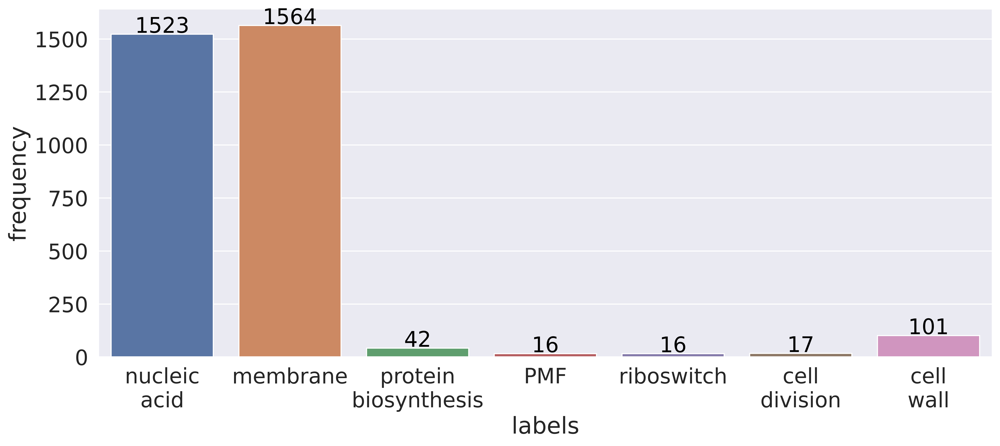

In [70]:
# showing class balance of SPARK MIC labels
frequencies = []
label_set = ['nucleic acid', 'membrane','protein biosynthesis','PMF','riboswitch','cell division','cell wall']
for label in label_set:
    frequencies.append(labeled_spk_df['label'].to_list().count(label))
class_balance_df = pd.DataFrame()
class_balance_df['labels'] = ['nucleic\nacid',
 'membrane',
 'protein\nbiosynthesis',
 'PMF',
 'riboswitch',
 'cell\ndivision',
 'cell\nwall']
class_balance_df['frequency'] = frequencies
fig = plt.figure(figsize=(15,6), dpi = 600)
sns.set(font_scale=1.8)
ax = sns.barplot(x="labels", y="frequency", data=class_balance_df, )
for p in ax.patches:
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()+10),
    ha='center', va='center', fontsize=20, color='black', xytext=(0, 5),
    textcoords='offset points')
# fig.savefig('../outputs/MIC_class_balance.png')

# Part 14: Generating external validation dataset

In [71]:
# least similar SPARK MIC molecules

val_smiles = labeled_spk_df['canon_SMILES'].to_list()
val_mols = [Chem.MolFromSmiles(s) for s in val_smiles]
val_fps = [Chem.RDKFingerprint(m) for m in val_mols]
val_labels = labeled_spk_df['label'].to_list()

nonhuman_drugs
mask = [label != 'brochado' for label in nonhuman_drugs.hold_out]
training_drugs = nonhuman_drugs[mask]
training_smiles = training_drugs['canon_SMILES'].to_list()
training_mols = [Chem.MolFromSmiles(s) for s in training_smiles]
training_fps = [Chem.RDKFingerprint(m) for m in training_mols]
training_labels = labeled_drugs['labels'].to_list()
set(val_labels)

{'PMF',
 'PMF, nucleic acid',
 'cell division',
 'cell wall',
 'membrane',
 'membrane, cell wall',
 'nucleic acid',
 'protein biosynthesis',
 'riboswitch'}

In [72]:
# takes 10 min to run -- generates all pairwise Tanimoto similarity scores between SPARK MIC and training datasets  
val_dict = {}
for smiles1, fp1, label in zip(val_smiles, val_fps, val_labels):
    hist = [0]
    for smiles2, fp2 in zip(training_smiles, training_fps):
        tanimoto = DataStructs.TanimotoSimilarity(fp1,fp2)
        hist.append(tanimoto)
        if tanimoto >= np.max(hist):
            max_label = label
    val_dict[smiles1] = (hist, max_label)

In [73]:
# saving pairwise Tanimoto similarity scores creating for external validation set
k = 20
df = pd.DataFrame()
df['smiles'] = val_smiles
df['labels'] = val_labels
df['max_tanimotos'] = [np.max(val_dict[smiles][0]) for smiles in val_smiles]
val_dfs = {}

for label in list(set(labeled_spk_df.label)):
    mask = [l in label in label for l in val_labels]
    if ',' in label:
        mask = [l == label in label for l in val_labels]
    masked_df = df[mask]
    masked_df.reset_index(inplace=True)
    idxs = np.argsort(masked_df['max_tanimotos'].to_list())
    least_similar_smiles = pd.DataFrame()
    least_similar_smiles['smiles'] = [masked_df['smiles'].iloc[idx] for idx in idxs[:min(k,len(masked_df))]]
    least_similar_smiles['labels'] = [masked_df['labels'].iloc[idx] for idx in idxs[:min(k,len(masked_df))]]
    least_similar_smiles['max_tanimotos'] = [masked_df['max_tanimotos'][idx] for idx in idxs[:min(k,len(masked_df))]]
    val_dfs[label] = least_similar_smiles
val_dfs
with open('../data/least_similar_MIC_data.pkl', 'wb') as handle:
    pickle.dump(val_dfs, handle, protocol=pickle.HIGHEST_PROTOCOL)

Now run chemprop commands to train and predict with deep models before analysis with model_analysis.ipynb

# Part 15: Similarity between train and test sets (from generate_chemprop_datasets.ipynb)

In [74]:
chemprop_train = pd.read_csv('../data/chemprop_nonhuman_multilabel_inputs/nonholdout.csv')
chemprop_test = pd.read_csv('../data/chemprop_nonhuman_multilabel_inputs/holdout.csv')

In [75]:
# looking at every pairwise Tanimoto score
train_mols = [Chem.MolFromSmiles(x) for x in chemprop_train['smiles'].to_list()]
train_fps = [Chem.RDKFingerprint(x) for x in train_mols if x is not None]
test_mols = [Chem.MolFromSmiles(x) for x in chemprop_test['smiles'].to_list()]
test_fps = [Chem.RDKFingerprint(x) for x in test_mols if x is not None]
tanimotos = []
for fp1 in train_fps:
    for fp2 in test_fps:
        tanimotos.append(DataStructs.TanimotoSimilarity(fp1,fp2))
tanimotos = np.array(tanimotos)

In [76]:
print('mean:',str(np.mean(tanimotos)))
print('median:',str(np.median(tanimotos)))
print('90th percentile:',str(np.quantile(tanimotos,0.9)))

mean: 0.31240919203714507
median: 0.2955801104972376
90th percentile: 0.47170900692840645
